# Importing data

In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#df=pd.read_csv('/content/drive/MyDrive/ML LAB/Stroke Prediction Project /healthcare-dataset-stroke-data.csv')
df=pd.read_csv('healthcare-dataset-stroke-data.csv')
df

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,Female,80.0,1,0,Yes,Private,Urban,83.75,NaN,never smoked,0
5106,44873,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,40.0,never smoked,0
5107,19723,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,30.6,never smoked,0
5108,37544,Male,51.0,0,0,Yes,Private,Rural,166.29,25.6,formerly smoked,0


# EDA

In [3]:
df.sample(10)

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
4566,56600,Female,43.0,0,0,Yes,Private,Rural,84.04,30.6,Unknown,0
2414,69502,Female,52.0,1,0,Yes,Private,Urban,155.86,27.2,smokes,0
4272,50412,Female,17.0,0,0,No,Private,Urban,96.47,25.6,Unknown,0
470,46474,Male,26.0,0,0,Yes,Private,Rural,100.09,27.4,never smoked,0
3036,25674,Male,40.0,0,0,Yes,Private,Urban,104.64,24.9,Unknown,0
2258,10584,Male,8.0,0,0,No,children,Urban,88.02,16.4,Unknown,0
2367,9013,Female,35.0,0,0,Yes,Private,Rural,83.27,19.8,formerly smoked,0
2773,72776,Male,26.0,0,0,Yes,Govt_job,Urban,94.24,29.2,formerly smoked,0
2560,54072,Female,11.0,0,0,No,children,Urban,81.31,18.8,never smoked,0
923,72020,Male,71.0,0,1,Yes,Self-employed,Rural,207.32,32.4,smokes,0


In [4]:
df.shape

(5110, 12)

In [5]:
df.describe()

,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
count,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,4909.000000,5110.000000
mean,36517.829354,43.226614,0.097456,0.054012,106.147677,28.893237,0.048728
std,21161.721625,22.612647,0.296607,0.226063,45.283560,7.854067,0.215320
min,67.000000,0.080000,0.000000,0.000000,55.120000,10.300000,0.000000
25%,17741.250000,25.000000,0.000000,0.000000,77.245000,23.500000,0.000000
50%,36932.000000,45.000000,0.000000,0.000000,91.885000,28.100000,0.000000
75%,54682.000000,61.000000,0.000000,0.000000,114.090000,33.100000,0.000000
max,72940.000000,82.000000,1.000000,1.000000,271.740000,97.600000,1.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   int64  
 1   gender             5110 non-null   object 
 2   age                5110 non-null   float64
 3   hypertension       5110 non-null   int64  
 4   heart_disease      5110 non-null   int64  
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   Residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 479.2+ KB


In [7]:
print(pd.unique(df['age']))

[6.70e+01 6.10e+01 8.00e+01 4.90e+01 7.90e+01 8.10e+01 7.40e+01 6.90e+01
 5.90e+01 7.80e+01 5.40e+01 5.00e+01 6.40e+01 7.50e+01 6.00e+01 5.70e+01
 7.10e+01 5.20e+01 8.20e+01 6.50e+01 5.80e+01 4.20e+01 4.80e+01 7.20e+01
 6.30e+01 7.60e+01 3.90e+01 7.70e+01 7.30e+01 5.60e+01 4.50e+01 7.00e+01
 6.60e+01 5.10e+01 4.30e+01 6.80e+01 4.70e+01 5.30e+01 3.80e+01 5.50e+01
 1.32e+00 4.60e+01 3.20e+01 1.40e+01 3.00e+00 8.00e+00 3.70e+01 4.00e+01
 3.50e+01 2.00e+01 4.40e+01 2.50e+01 2.70e+01 2.30e+01 1.70e+01 1.30e+01
 4.00e+00 1.60e+01 2.20e+01 3.00e+01 2.90e+01 1.10e+01 2.10e+01 1.80e+01
 3.30e+01 2.40e+01 3.40e+01 3.60e+01 6.40e-01 4.10e+01 8.80e-01 5.00e+00
 2.60e+01 3.10e+01 7.00e+00 1.20e+01 6.20e+01 2.00e+00 9.00e+00 1.50e+01
 2.80e+01 1.00e+01 1.80e+00 3.20e-01 1.08e+00 1.90e+01 6.00e+00 1.16e+00
 1.00e+00 1.40e+00 1.72e+00 2.40e-01 1.64e+00 1.56e+00 7.20e-01 1.88e+00
 1.24e+00 8.00e-01 4.00e-01 8.00e-02 1.48e+00 5.60e-01 4.80e-01 1.60e-01]


In [8]:
print(pd.unique(df['bmi']))

[36.6  nan 32.5 34.4 24.  29.  27.4 22.8 24.2 29.7 36.8 27.3 28.2 30.9
 37.5 25.8 37.8 22.4 48.9 26.6 27.2 23.5 28.3 44.2 25.4 22.2 30.5 26.5
 33.7 23.1 32.  29.9 23.9 28.5 26.4 20.2 33.6 38.6 39.2 27.7 31.4 36.5
 33.2 32.8 40.4 25.3 30.2 47.5 20.3 30.  28.9 28.1 31.1 21.7 27.  24.1
 45.9 44.1 22.9 29.1 32.3 41.1 25.6 29.8 26.3 26.2 29.4 24.4 28.  28.8
 34.6 19.4 30.3 41.5 22.6 56.6 27.1 31.3 31.  31.7 35.8 28.4 20.1 26.7
 38.7 34.9 25.  23.8 21.8 27.5 24.6 32.9 26.1 31.9 34.1 36.9 37.3 45.7
 34.2 23.6 22.3 37.1 45.  25.5 30.8 37.4 34.5 27.9 29.5 46.  42.5 35.5
 26.9 45.5 31.5 33.  23.4 30.7 20.5 21.5 40.  28.6 42.2 29.6 35.4 16.9
 26.8 39.3 32.6 35.9 21.2 42.4 40.5 36.7 29.3 19.6 18.  17.6 19.1 50.1
 17.7 54.6 35.  22.  39.4 19.7 22.5 25.2 41.8 60.9 23.7 24.5 31.2 16.
 31.6 25.1 24.8 18.3 20.  19.5 36.  35.3 40.1 43.1 21.4 34.3 27.6 16.5
 24.3 25.7 21.9 38.4 25.9 54.7 18.6 24.9 48.2 20.7 39.5 23.3 64.8 35.1
 43.6 21.  47.3 16.6 21.6 15.5 35.6 16.7 41.9 16.4 17.1 29.2 37.9 44.6
 39.6 4

In [9]:
print(pd.unique(df['avg_glucose_level']))

[228.69 202.21 105.92 ...  82.99 166.29  85.28]


# Visualization

In [10]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
import plotly.express as ex
import plotly.graph_objs as go
import plotly.offline as pyo
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
pyo.init_notebook_mode()
from imblearn.over_sampling import SMOTE
# import scikitplot as skplt


from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.model_selection import train_test_split,cross_val_score


from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.tree import DecisionTreeRegressor,DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import os

from sklearn.metrics import classification_report,confusion_matrix,f1_score
import warnings
warnings.filterwarnings('ignore')

plt.rc('figure',figsize=(17,13))
sns.set_context('paper',font_scale=2)

def set_seed(seed=31415):
    np.random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
set_seed()

In [11]:
df.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


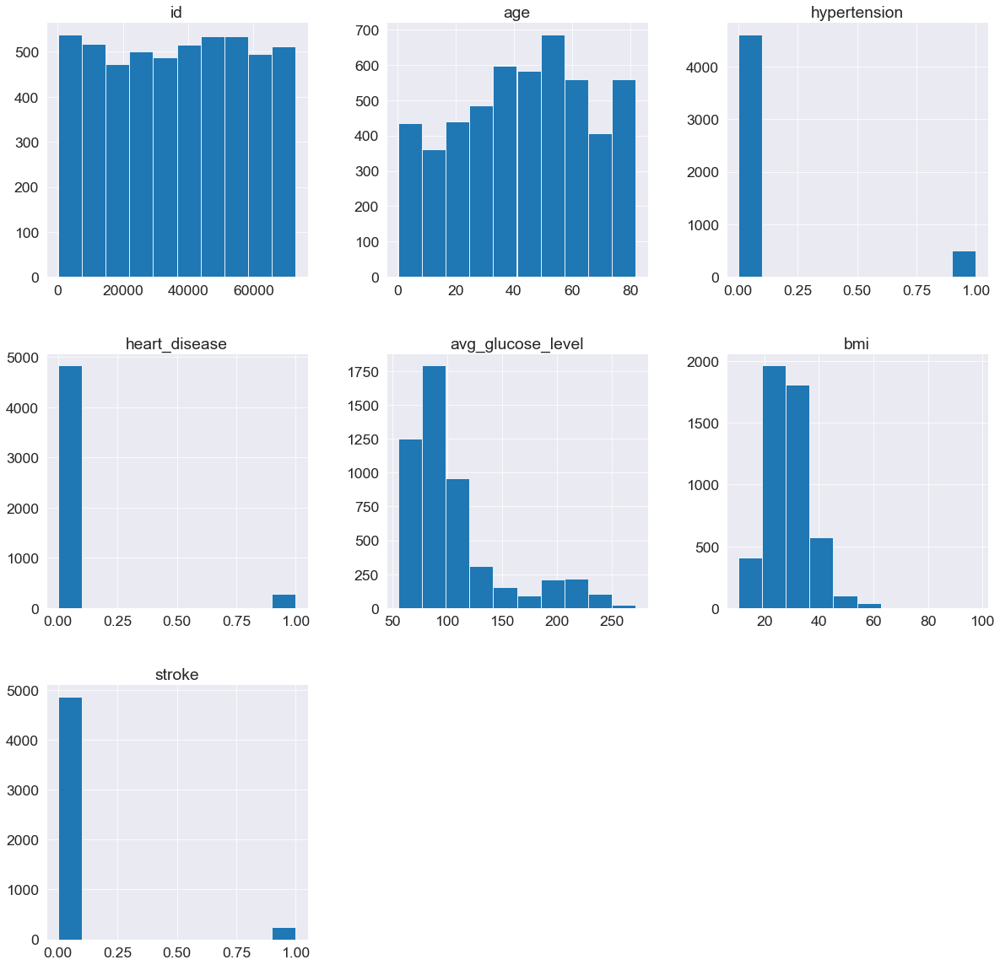

In [12]:
df.hist(figsize = (20, 20))
plt.show()

Stroke Percentage

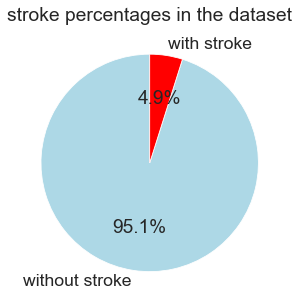

In [13]:
# labels = df['stroke'].value_counts(sort = True).index 
labels = ["without stroke", "with stroke"]
# this counts the number of distinct stroke values (in this case its 0 and 1) so we get 2 different stroke value's counts sorted in ascending order. This returns a series -- we get the indices of that df as a list -- so we will get [0, 1] as the list of indices because there are only 2 unique values of stroke
sizes = df['stroke'].value_counts(sort = True)
# this counts the number of distinct stroke values (in this case its 0 and 1) so we get 2 different stroke value's counts sorted in ascending order. This returns a series
colors = ["lightblue","red"]
 
plt.figure(figsize=(5,5))
plt.pie(sizes, labels=labels, colors=colors, autopct='%.1f%%', shadow=False, startangle=90,)

plt.title('stroke percentages in the dataset')
plt.show()

In [14]:
print(labels)
print("\n\n")
print(sizes)

['without stroke', 'with stroke']



0    4861
1     249
Name: stroke, dtype: int64


EDA

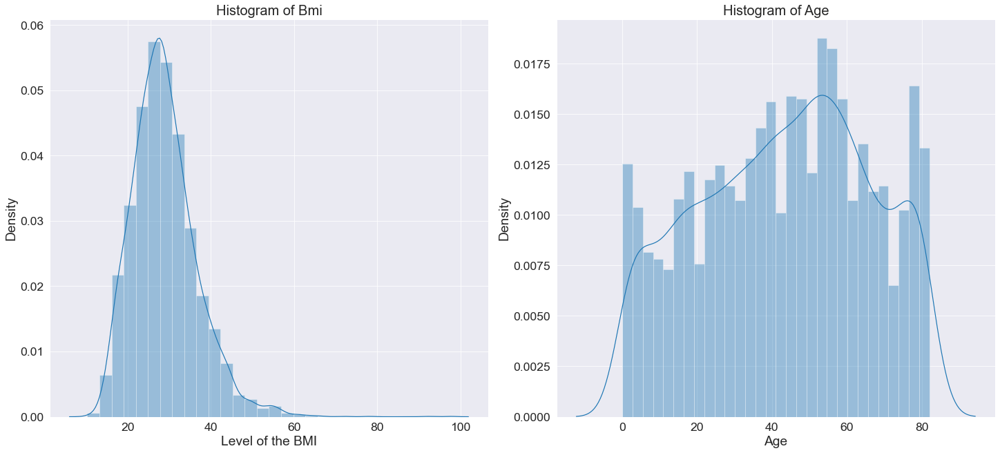

In [15]:
def plot_hist(col, bins=30, title="",xlabel="",ax=None):
    sns.distplot(col, bins=bins,ax=ax)
    ax.set_title(f'Histogram of {title}',fontsize=20)
    ax.set_xlabel(xlabel)
# Here, we are dividing each of the attributes into 30 bins of equal size and plotting their respective histograms

fig, axes = plt.subplots(1,2,figsize=(20,9),constrained_layout=True)
plot_hist(df.bmi,
          title='Bmi',
          xlabel="Level of the BMI",
          ax=axes[0])
plot_hist(df.age,
          bins=30,
          title='Age',
          xlabel='Age',
          ax=axes[1])

plt.show()

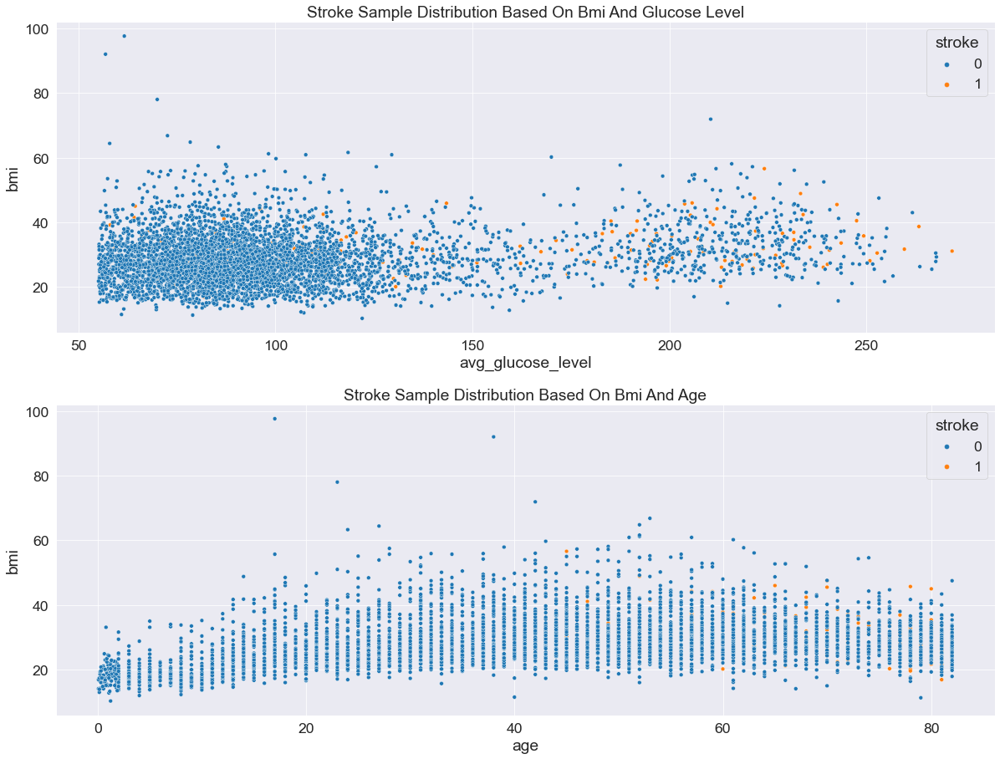

In [16]:
plt.subplot(2,1,1)
plt.title('Stroke Sample Distribution Based On Bmi And Glucose Level')
sns.scatterplot(x=df['avg_glucose_level'],y=df['bmi'],hue=df['stroke'])
plt.subplot(2,1,2)
plt.title('Stroke Sample Distribution Based On Bmi And Age')
sns.scatterplot(x=df['age'],y=df['bmi'],hue=df['stroke'])
plt.tight_layout()
plt.show()

From the above 2 scatter plots, we can see that:

-> The people with BMI < 60 are getting stroke
-> People with High age are are more probable for having a stroke
-> high average_glucose_level are more probable for having a stroke

Combining, people who hace BMI value region under 60 and in high glucose levels as well as old age are getting strokes more often.

Male vs Female

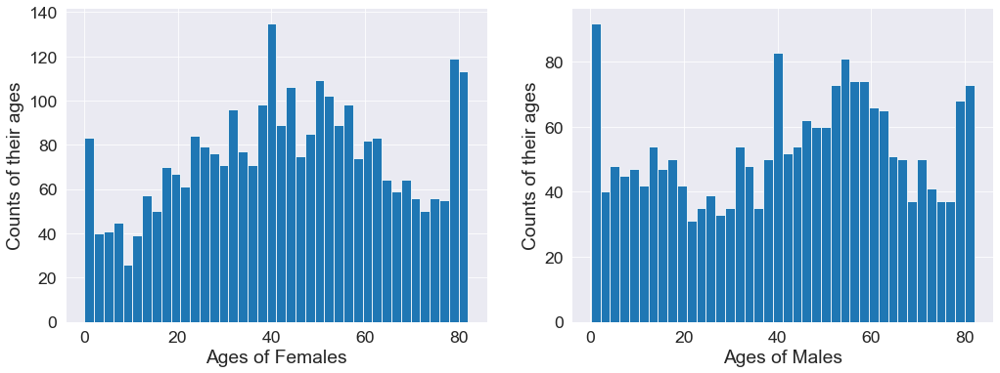

In [17]:
plt.figure()
plt.subplot(2,2,1)
x=df.query('gender=="Female"').age
plt.xlabel('Ages of Females')
plt.ylabel('Counts of their ages')
plt.hist(x, bins = 40)
plt.subplot(2,2,2)
x=df.query('gender=="Male"').age
plt.xlabel('Ages of Males')
plt.ylabel('Counts of their ages')
plt.hist(x, bins = 40)
plt.show()

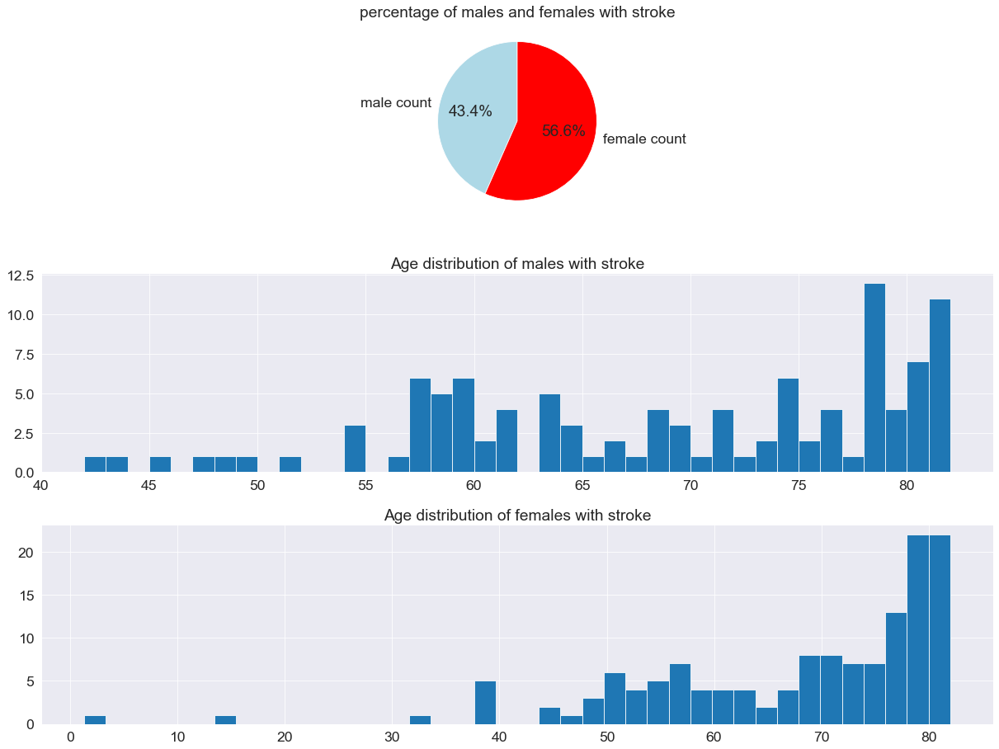

<Figure size 1296x3600 with 0 Axes>

In [18]:
stroke_population = df.query('stroke ==1')
# print(stroke_population)
female_positive_age = stroke_population.query('gender=="Female"').age
male_positive_age = stroke_population.query('gender=="Male"').age
female_positive = stroke_population.query('gender=="Female"').shape[0]
# print(female_positive)
male_positive = stroke_population.query('gender=="Male"').shape[0]
# print(male_positive)
list1 = []
list1.append(male_positive)
list1.append(female_positive)
# print(list1)
pielables1 = ["male count", "female count"]
# print(male_positive_age)
plt.subplot(3,1,2)
plt.title('Age distribution of males with stroke')
plt.hist(male_positive_age, bins = 40)
plt.subplot(3,1,3)
plt.title('Age distribution of females with stroke')
plt.hist(female_positive_age, bins = 40)
plt.subplot(3,1,1)
plt.title('percentage of males and females with stroke')
plt.pie(list1, labels=pielables1, colors=["lightblue","red"], autopct='%.1f%%', shadow=False, startangle=90,)
plt.tight_layout()
plt_1 = plt.figure(figsize = (18,50))
plt.show()


Firstly, the number of females in the dataset is higher that males. So, naturally, we can observe that the more females have stroke than males.

We can also observe from the histogram that men are more prone to stroke in 
50 - 60 age range than in 60 - 70. But men with age>75 have a high chance of stroke

In females, the risk of getting stroke rises gradually as they get old.

Work Type

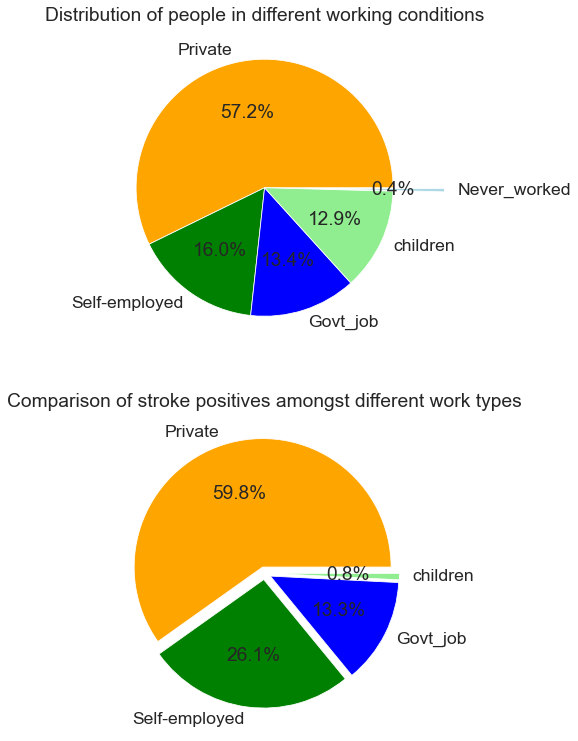

In [19]:
# print(df['work_type'].unique())
self_employed_positive = stroke_population.query('work_type=="Self-employed"').shape[0]
private_positive = stroke_population.query('work_type=="Private"').shape[0]
govt_job_positive = stroke_population.query('work_type=="Govt_job"').shape[0]
children_positive = stroke_population.query('work_type=="children"').shape[0]
never_worked_positive = stroke_population.query('work_type=="Never_worked"').shape[0]
list2 = []
list2.append(private_positive)
list2.append(self_employed_positive)
list2.append(govt_job_positive)
list2.append(children_positive)
# list2.append(never_worked_positive)
pielables2 = []
for _ in df['work_type'].unique():
  if _ != 'Never_worked':
    pielables2.append(_)

colors2=['orange','green','blue','lightgreen']
plt.subplot(2,1,2)
plt.pie(list2, labels=pielables2, colors=colors2, autopct='%.1f%%', shadow=False, startangle=0, explode = [0.05, 0.05, 0.05, 0.05])
# print(list2)
plt.title("Comparison of stroke positives amongst different work types")
plt.subplot(2,1,1)
plt.title("Distribution of people in different working conditions")
work_types = df['work_type'].value_counts(sort = True)
worklables = df['work_type'].unique()
plt.pie(work_types, labels=worklables, colors=['orange','green','blue','lightgreen','lightblue'], autopct='%.1f%%', shadow=False, startangle=0, explode = [0, 0, 0, 0, 0.4])
plt.show()



Here, we can observe that even though Self-employed only forms 16% of the total working class, they comprise of 26% of the people who have stroke.

even though children only forms 13% of the total working class, they comprise of 0.8% of the people who have stroke.

this tells that self-employed people have higher chance of getting stroke wheras those who have childern are less likely to get stroke.

Hyper tension and Heart disease

[66, 183]


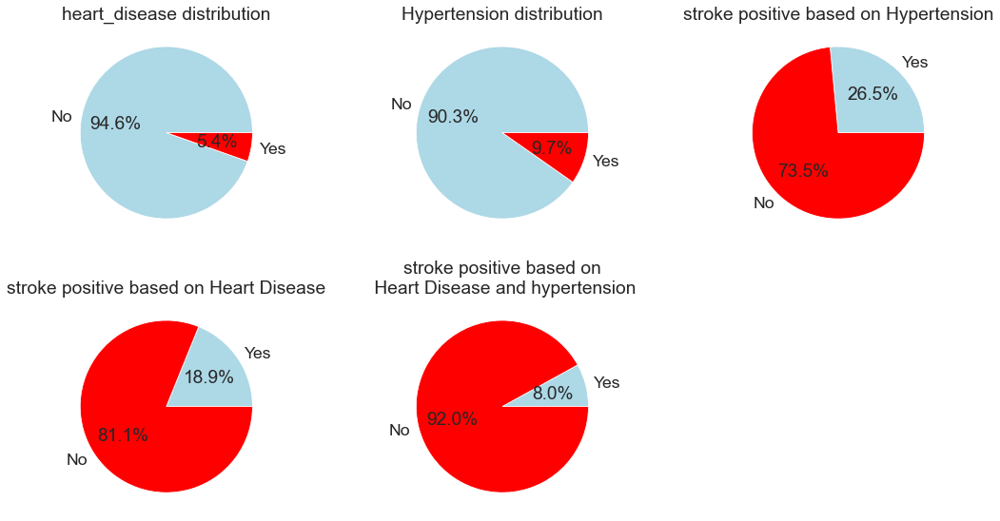

In [20]:
# print(df['smoking_status'].unique())
hypertension_positive = stroke_population.query('hypertension==1').shape[0]
nohyper_positive = stroke_population.query('hypertension==0').shape[0]
heartdisease_positive = stroke_population.query('heart_disease==1').shape[0]
noheartdisease_positive = stroke_population.query('heart_disease==0').shape[0]
heartandhyper_positive = stroke_population.query('heart_disease==1 and hypertension==1').shape[0]
heartandhyper_negative = stroke_population.query('heart_disease==0 and hypertension==0').shape[0]

# list5 = []
# list5.append(formerly_smoked_positive)
# list5.append(never_smoked_positive)
# list5.append(smokes_positive)
# list5.append(unknown_positive)
list6 = []
list6.append(hypertension_positive)
list6.append(nohyper_positive)
print(list6)

list7 = []
list7.append(heartdisease_positive)
list7.append(noheartdisease_positive)

list8 = []
list8.append(heartandhyper_positive)
list8.append(heartandhyper_negative)


commonlables = ['No', 'Yes']
colourscommon = ["lightblue","red"]

# pielables5 = df['smoking_status'].unique()
plt.figure(figsize=(15,20))
# colors5=['orange','green','blue','lightgreen']
plt.subplot(5,3,1)
heart_full = df['heart_disease'].value_counts(sort = True)
plt.pie(heart_full, labels=commonlables, colors=colourscommon, autopct='%.1f%%', shadow=False, startangle=0, explode = [0,0])
# # # print(list2)
plt.title("heart_disease distribution")
plt.subplot(5,3,2)
plt.title("Hypertension distribution")
hyper_full = df['hypertension'].value_counts(sort = True)
# # worklables = df['work_type'].unique()
plt.pie(hyper_full, labels=commonlables, colors=colourscommon, autopct='%.1f%%', shadow=False, startangle=0, explode = [0,0])
plt.subplot(5,3,3)
plt.title("stroke positive based on Hypertension")
commonlables = ['Yes', 'No']
plt.pie(list6, labels=commonlables, colors=colourscommon, autopct='%.1f%%', shadow=False, startangle=0, explode = [0,0])
plt.subplot(5,3,4)
plt.title("stroke positive based on Heart Disease")
plt.pie(list7, labels=commonlables, colors=colourscommon, autopct='%.1f%%', shadow=False, startangle=0, explode = [0,0])
plt.subplot(5,3,5)
plt.title("stroke positive based on\n Heart Disease and hypertension")
plt.pie(list8, labels=commonlables, colors=colourscommon, autopct='%.1f%%', shadow=False, startangle=0, explode = [0,0])
plt.tight_layout()
plt.show()

In [21]:
print(df.heart_disease.value_counts())

0    4834
1     276
Name: heart_disease, dtype: int64


In [22]:
df.loc[(df['heart_disease']==1) & (df['stroke']==1)].value_counts()

id     gender  age   hypertension  heart_disease  ever_married  work_type      Residence_type  avg_glucose_level  bmi   smoking_status   stroke
712    Female  82.0  1             1              No            Private        Rural           84.03              26.5  formerly smoked  1         1
3253   Male    61.0  0             1              Yes           Private        Rural           111.81             27.3  smokes           1         1
48405  Male    80.0  0             1              Yes           Private        Urban           68.53              24.2  smokes           1         1
53401  Male    71.0  1             1              No            Govt_job       Rural           216.94             30.9  never smoked     1         1
53882  Male    74.0  1             1              Yes           Private        Rural           70.09              27.4  never smoked     1         1
54401  Male    80.0  0             1              Yes           Self-employed  Urban           252.72          

Marital Status

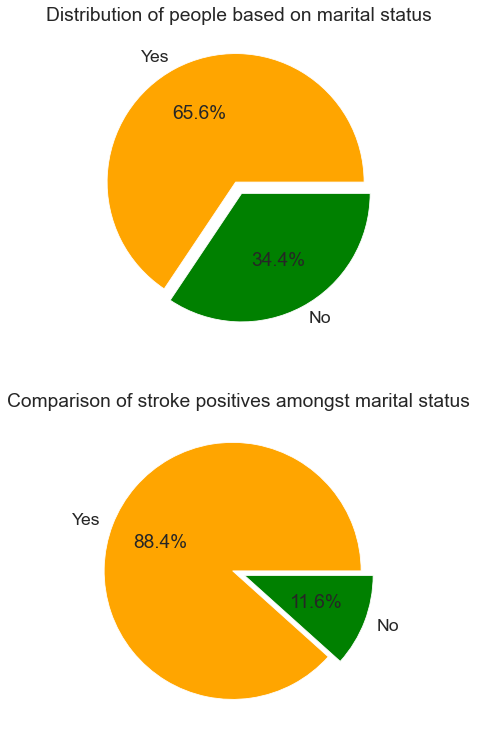

In [23]:
# print(df['work_type'].unique())
married_positive = stroke_population.query('ever_married=="Yes"').shape[0]
unmarried_positive = stroke_population.query('ever_married=="No"').shape[0]

list3 = []
list3.append(married_positive)
list3.append(unmarried_positive)

pielables3 = df['ever_married'].unique()
colors3=['orange','green']
plt.subplot(2,1,2)
plt.pie(list3, labels=pielables3, colors=colors3, autopct='%.1f%%', shadow=False, startangle=0, explode = [0.05, 0.05])
# print(list2)
plt.title("Comparison of stroke positives amongst marital status")
plt.subplot(2,1,1)
plt.title("Distribution of people based on marital status")
marital_status = df['ever_married'].value_counts(sort = True)
# worklables = df['work_type'].unique()
plt.pie(marital_status, labels=pielables3, colors=['orange','green'], autopct='%.1f%%', shadow=False, startangle=0, explode = [0.05, 0.05])
plt.show()

fom the above pie charts, we can infer that married people are slightly more likely to get a stroke

Residence Type

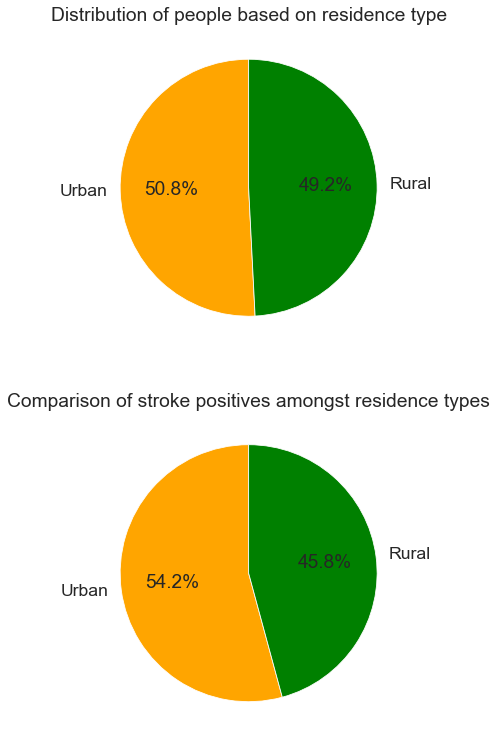

In [24]:
# print(df['Residence_type'].unique())
urban_positive = stroke_population.query('Residence_type=="Urban"').shape[0]
rural_positive = stroke_population.query('Residence_type=="Rural"').shape[0]
# govt_job_positive = stroke_population.query('work_type=="Govt_job"').shape[0]
# children_positive = stroke_population.query('work_type=="children"').shape[0]
# never_worked_positive = stroke_population.query('work_type=="Never_worked"').shape[0]
list4 = []
list4.append(urban_positive)
list4.append(rural_positive)
reside_type = df['Residence_type'].unique()
colors4=['orange','green']
# list2.append(govt_job_positive)
# list2.append(children_positive)
# # list2.append(never_worked_positive)
# pielables2 = []
# for _ in df['work_type'].unique():
#   if _ != 'Never_worked':
#     pielables2.append(_)

# colors2=['orange','green','blue','lightgreen']
plt.subplot(2,1,2)
plt.pie(list4, labels=reside_type, colors=colors3, autopct='%.1f%%', shadow=False, startangle=90)
# # print(list2)
plt.title("Comparison of stroke positives amongst residence types")
plt.subplot(2,1,1)
plt.title("Distribution of people based on residence type")
reside_type1 = df['Residence_type'].value_counts(sort = True)
# worklables = df['work_type'].unique()
plt.pie(reside_type1, labels=reside_type, colors=['orange','green'], autopct='%.1f%%', shadow=False, startangle=90)
plt.show()

from this, we can infer that the residence type dosen't tell much about having greater probability for having a stroke because they are distrubuted equally.

Smoking

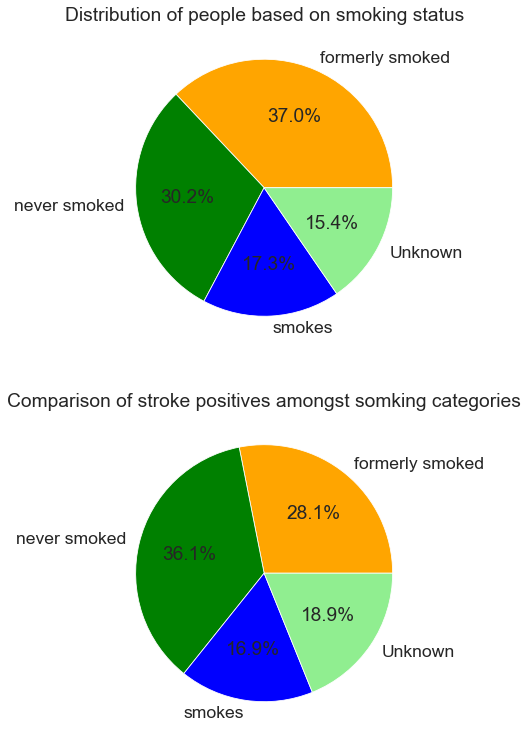

In [25]:
# print(df['smoking_status'].unique())
formerly_smoked_positive = stroke_population.query('smoking_status=="formerly smoked"').shape[0]
never_smoked_positive = stroke_population.query('smoking_status=="never smoked"').shape[0]
smokes_positive = stroke_population.query('smoking_status=="smokes"').shape[0]
unknown_positive = stroke_population.query('smoking_status=="Unknown"').shape[0]

list5 = []
list5.append(formerly_smoked_positive)
list5.append(never_smoked_positive)
list5.append(smokes_positive)
list5.append(unknown_positive)

pielables5 = df['smoking_status'].unique()

colors5=['orange','green','blue','lightgreen']
plt.subplot(2,1,2)
plt.pie(list5, labels=pielables5, colors=colors5, autopct='%.1f%%', shadow=False, startangle=0, explode = [0,0,0,0])
# # print(list2)
plt.title("Comparison of stroke positives amongst somking categories")
plt.subplot(2,1,1)
plt.title("Distribution of people based on smoking status")
smoke_types = df['smoking_status'].value_counts(sort = True)
# worklables = df['work_type'].unique()
plt.pie(smoke_types, labels=pielables5, colors=colors5, autopct='%.1f%%', shadow=False, startangle=0, explode = [0,0,0,0])
plt.show()


# Data Pre-Processing

### Finding Null Values

In [26]:
df.isna().sum()

id                     0
gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64

### Rows where BMI values are Null

In [27]:
d2=df.loc[df['bmi'].isna()==True]
d2

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
8,27419,Female,59.0,0,0,Yes,Private,Rural,76.15,NaN,Unknown,1
13,8213,Male,78.0,0,1,Yes,Private,Urban,219.84,NaN,Unknown,1
19,25226,Male,57.0,0,1,No,Govt_job,Urban,217.08,NaN,Unknown,1
27,61843,Male,58.0,0,0,Yes,Private,Rural,189.84,NaN,Unknown,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5039,42007,Male,41.0,0,0,No,Private,Rural,70.15,NaN,formerly smoked,0
5048,28788,Male,40.0,0,0,Yes,Private,Urban,191.15,NaN,smokes,0
5093,32235,Female,45.0,1,0,Yes,Govt_job,Rural,95.02,NaN,smokes,0
5099,7293,Male,40.0,0,0,Yes,Private,Rural,83.94,NaN,smokes,0


### Replacing NaN values with Mean

In [28]:
from sklearn.impute import SimpleImputer
my_imputer=SimpleImputer(missing_values=np.NaN,strategy="mean")
newdf=my_imputer.fit_transform(df['bmi'].values.reshape(-1,1))
df.bmi=newdf
df

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.600000,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,28.893237,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.500000,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.400000,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.000000,never smoked,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,Female,80.0,1,0,Yes,Private,Urban,83.75,28.893237,never smoked,0
5106,44873,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,40.000000,never smoked,0
5107,19723,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,30.600000,never smoked,0
5108,37544,Male,51.0,0,0,Yes,Private,Rural,166.29,25.600000,formerly smoked,0


### Encoding Data

In [29]:
from sklearn.preprocessing import LabelEncoder
encoder=LabelEncoder()
df['gender']=encoder.fit_transform(df['gender'])
df['Residence_type']=encoder.fit_transform(df['Residence_type'])
df['ever_married']=encoder.fit_transform(df['ever_married'])
df['work_type']=encoder.fit_transform(df['work_type'])
df['smoking_status']=encoder.fit_transform(df['smoking_status'])
df

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,1,67.0,0,1,1,2,1,228.69,36.600000,1,1
1,51676,0,61.0,0,0,1,3,0,202.21,28.893237,2,1
2,31112,1,80.0,0,1,1,2,0,105.92,32.500000,2,1
3,60182,0,49.0,0,0,1,2,1,171.23,34.400000,3,1
4,1665,0,79.0,1,0,1,3,0,174.12,24.000000,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,0,80.0,1,0,1,2,1,83.75,28.893237,2,0
5106,44873,0,81.0,0,0,1,3,1,125.20,40.000000,2,0
5107,19723,0,35.0,0,0,1,3,0,82.99,30.600000,2,0
5108,37544,1,51.0,0,0,1,2,0,166.29,25.600000,1,0


Outliers

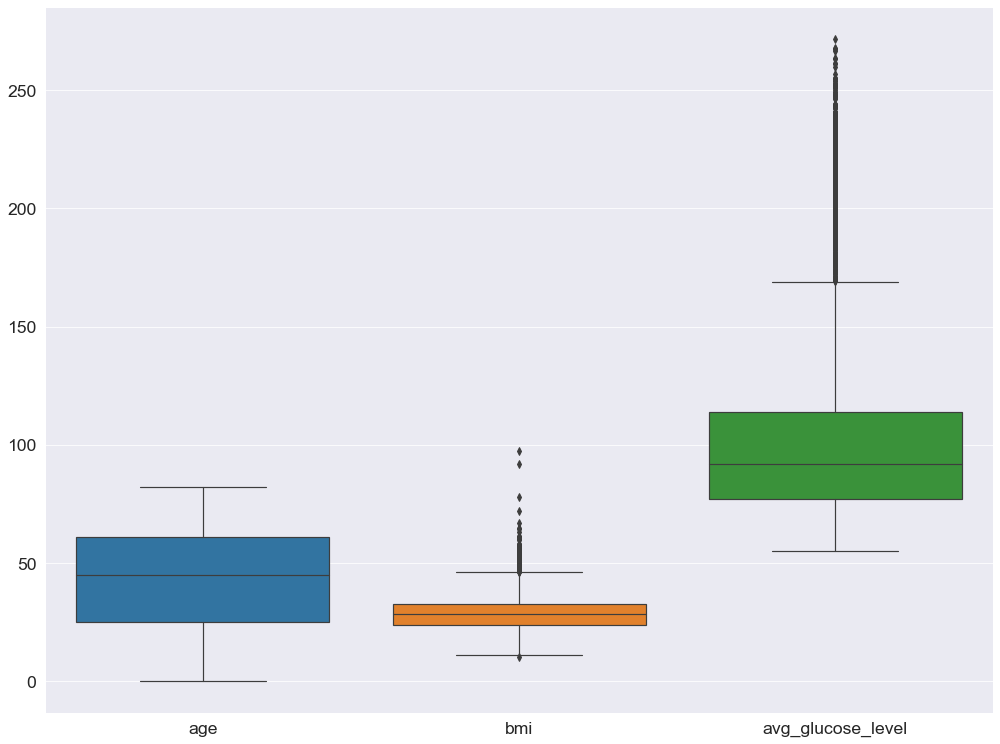

(5110, 12)

In [30]:
sns.boxplot(data=df[["age","bmi","avg_glucose_level"]])
plt.show()
df.shape

### Removing Outliers

In [31]:
Q1 = df["bmi"].quantile(0.25)
Q3 = df["bmi"].quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR
print("BMI Max Value:" , df["bmi"].max())
print("BMI Min Value:" , df["bmi"].min())
print("BMI Lower Limit:", lower_limit)
print("BMI Upper Limit:", upper_limit)
new_df = df.loc[(df["bmi"] > lower_limit) & (df["bmi"] < upper_limit)]
new_df
Q1 = new_df["avg_glucose_level"].quantile(0.25)
Q3 = new_df["avg_glucose_level"].quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR
print("Avg_glucose level Max Value:" , new_df["avg_glucose_level"].max())
print("Avg_glucose level Min Value:" , new_df["avg_glucose_level"].min())
print("Avg_glucose level Lower Limit:", lower_limit)
print("Avg_glucose level Upper Limit:", upper_limit)
sampled_df = new_df.loc[(new_df["avg_glucose_level"] > lower_limit) & (new_df["avg_glucose_level"] < upper_limit)]
sampled_df

BMI Max Value: 97.6
BMI Min Value: 10.3
BMI Lower Limit: 10.300000000000006
BMI Upper Limit: 46.29999999999999
Avg_glucose level Max Value: 271.74
Avg_glucose level Min Value: 55.12
Avg_glucose level Lower Limit: 22.36125000000002
Avg_glucose level Upper Limit: 168.59124999999997


,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
2,31112,1,80.0,0,1,1,2,0,105.92,32.500000,2,1
6,53882,1,74.0,1,1,1,2,0,70.09,27.400000,2,1
7,10434,0,69.0,0,0,0,2,1,94.39,22.800000,2,1
8,27419,0,59.0,0,0,1,2,0,76.15,28.893237,0,1
9,60491,0,78.0,0,0,1,2,1,58.57,24.200000,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,0,80.0,1,0,1,2,1,83.75,28.893237,2,0
5106,44873,0,81.0,0,0,1,3,1,125.20,40.000000,2,0
5107,19723,0,35.0,0,0,1,3,0,82.99,30.600000,2,0
5108,37544,1,51.0,0,0,1,2,0,166.29,25.600000,1,0


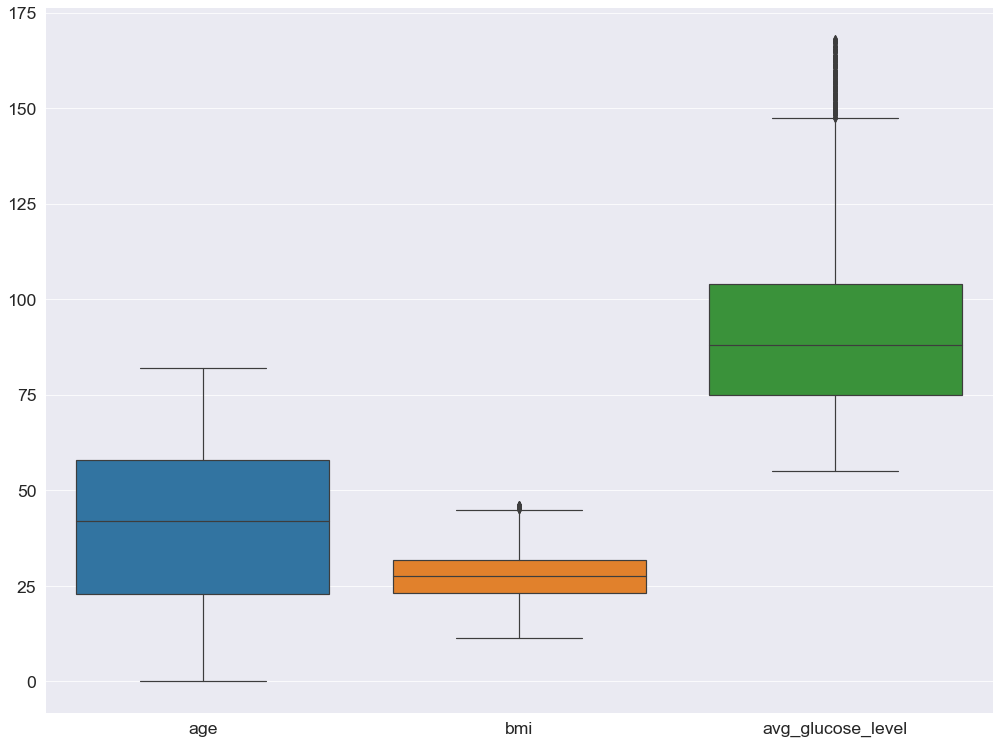

(4390, 12)

In [32]:
sns.boxplot(data=sampled_df[["age","bmi","avg_glucose_level"]])
plt.show()
sampled_df.shape

In [33]:
sampled_df

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
2,31112,1,80.0,0,1,1,2,0,105.92,32.500000,2,1
6,53882,1,74.0,1,1,1,2,0,70.09,27.400000,2,1
7,10434,0,69.0,0,0,0,2,1,94.39,22.800000,2,1
8,27419,0,59.0,0,0,1,2,0,76.15,28.893237,0,1
9,60491,0,78.0,0,0,1,2,1,58.57,24.200000,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,0,80.0,1,0,1,2,1,83.75,28.893237,2,0
5106,44873,0,81.0,0,0,1,3,1,125.20,40.000000,2,0
5107,19723,0,35.0,0,0,1,3,0,82.99,30.600000,2,0
5108,37544,1,51.0,0,0,1,2,0,166.29,25.600000,1,0


### Finding correlation

In [34]:
corr=sampled_df.corr().sort_values(by='stroke',ascending=False)
#df.corrwith(df['stroke'])
corr.iloc[1:,11]

age                  0.227138
hypertension         0.113044
ever_married         0.094415
heart_disease        0.089726
bmi                  0.034124
smoking_status       0.020953
Residence_type       0.010115
avg_glucose_level    0.003014
id                   0.000493
gender              -0.001682
work_type           -0.023940
Name: stroke, dtype: float64

# Base models

## Splitting, sampling and scaling

In [35]:
model=sampled_df[['gender','age','hypertension','heart_disease','ever_married','work_type','avg_glucose_level','bmi','smoking_status','Residence_type']]
model

,gender,age,hypertension,heart_disease,ever_married,work_type,avg_glucose_level,bmi,smoking_status,Residence_type
2,1,80.0,0,1,1,2,105.92,32.500000,2,0
6,1,74.0,1,1,1,2,70.09,27.400000,2,0
7,0,69.0,0,0,0,2,94.39,22.800000,2,1
8,0,59.0,0,0,1,2,76.15,28.893237,0,0
9,0,78.0,0,0,1,2,58.57,24.200000,0,1
...,...,...,...,...,...,...,...,...,...,...
5105,0,80.0,1,0,1,2,83.75,28.893237,2,1
5106,0,81.0,0,0,1,3,125.20,40.000000,2,1
5107,0,35.0,0,0,1,3,82.99,30.600000,2,0
5108,1,51.0,0,0,1,2,166.29,25.600000,1,0


In [36]:
target=pd.DataFrame(sampled_df['stroke'])
target.sample(10)

,stroke
3865,0
987,0
3785,0
4937,0
3518,0
402,0
1608,0
3944,0
2331,0
4178,0


In [37]:
from sklearn.model_selection import train_test_split,RepeatedStratifiedKFold,cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import f1_score,roc_auc_score,accuracy_score,confusion_matrix, \
precision_recall_curve,auc,roc_curve,recall_score, classification_report

### Sampling the data

In [38]:
from imblearn.over_sampling import SMOTE
smote=SMOTE()
x_smote,y_smote=smote.fit_resample(model,target)

### Scaling for the model

In [39]:
scaler=MinMaxScaler()
scaler.fit(x_smote)
model_rescaled=scaler.transform(x_smote)
disscale=pd.DataFrame(model_rescaled)
disscale.columns=model.columns
disscale

,gender,age,hypertension,heart_disease,ever_married,work_type,avg_glucose_level,bmi,smoking_status,Residence_type
0,0.5,0.975586,0.0,1.0,1.0,0.50,0.449438,0.607450,0.666667,0.0
1,0.5,0.902344,1.0,1.0,1.0,0.50,0.132443,0.461318,0.666667,0.0
2,0.0,0.841309,0.0,0.0,0.0,0.50,0.347430,0.329513,0.666667,1.0
3,0.0,0.719238,0.0,0.0,1.0,0.50,0.186057,0.504104,0.000000,0.0
4,0.0,0.951172,0.0,0.0,1.0,0.50,0.030523,0.369628,0.000000,1.0
...,...,...,...,...,...,...,...,...,...,...
8445,0.0,0.616092,0.0,0.0,0.0,0.00,0.430253,0.488090,0.333333,0.0
8446,0.0,0.924191,0.0,0.0,0.0,0.75,0.482866,0.518486,0.000000,0.0
8447,0.0,0.853944,0.0,0.0,0.0,0.75,0.148029,0.712864,0.666667,1.0
8448,0.5,0.704669,1.0,0.0,1.0,0.00,0.205551,0.467603,0.333333,0.0


### spliting the model

In [40]:
xtrain,xtest,ytrain,ytest=train_test_split(disscale,y_smote,test_size=0.3)
xtrain.round(3).sample(10)

,gender,age,hypertension,heart_disease,ever_married,work_type,avg_glucose_level,bmi,smoking_status,Residence_type
337,0.0,0.951,0.0,0.0,1.0,0.75,0.534,0.473,0.667,0.0
6858,0.0,0.871,0.0,0.0,1.0,0.50,0.403,0.452,0.333,0.0
798,0.0,0.255,0.0,0.0,1.0,0.50,0.036,0.324,0.667,1.0
5467,0.0,0.964,0.0,0.0,1.0,0.50,0.181,0.363,0.000,0.0
2082,0.5,0.019,0.0,0.0,0.0,1.00,0.726,0.215,0.000,0.0
8088,0.0,0.986,0.0,0.0,1.0,0.50,0.167,0.389,0.333,0.0
193,0.5,0.170,0.0,0.0,0.0,0.00,0.241,0.582,0.000,1.0
1618,0.0,0.438,0.0,0.0,1.0,0.50,0.400,0.341,0.667,0.0
1811,0.5,0.121,0.0,0.0,0.0,1.00,0.002,0.115,0.000,1.0
4265,0.0,0.268,0.0,0.0,0.0,0.50,0.752,0.281,0.667,1.0


## Logistic Regression

In [41]:
logreg=LogisticRegression()

In [42]:
logreg.fit(xtrain,ytrain.values.reshape(-1))
pred=logreg.predict(xtest)

In [43]:
slopes=logreg.coef_
intercepts=logreg.intercept_
print("\u03B2[1:7] Values",slopes)
print("\u03B20 Value",intercepts)

β[1:7] Values [[-1.45606306  7.60224513 -1.01647525 -1.63146244 -0.98145263 -1.37074773
  -0.07612116  1.04017315 -1.06573153 -1.01798248]]
β0 Value [-3.02329719]


In [44]:
logres=pd.DataFrame({'Predicted':pred,'Actual':ytest.values.reshape(-1)})
logres

,Predicted,Actual
0,0,0
1,0,0
2,0,0
3,0,0
4,1,0
...,...,...
2530,0,1
2531,0,1
2532,1,1
2533,1,0


In [45]:
lr_cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3)
scores_lr = cross_val_score(logreg, disscale, y_smote.values.ravel(), cv=lr_cv, scoring='roc_auc')

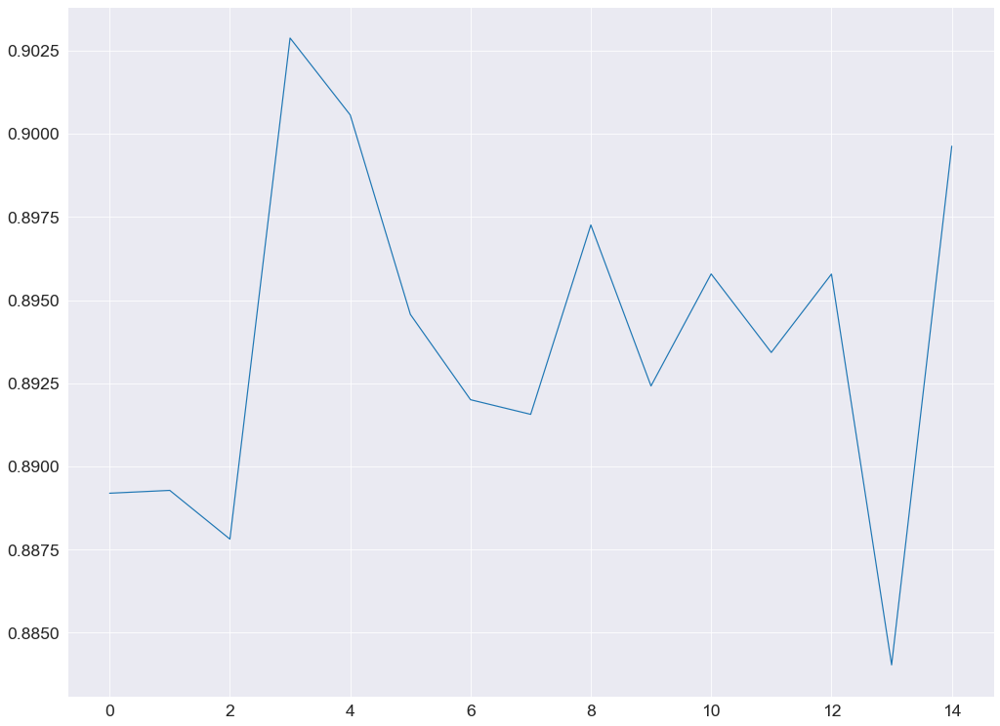

In [46]:
plt.plot(scores_lr)

In [47]:
lr_kf=scores_lr.mean().round(3)
print("Accuracy of Logistic Regression model",lr_kf)

Accuracy of Logistic Regression model 0.894


### Confusion Matrix

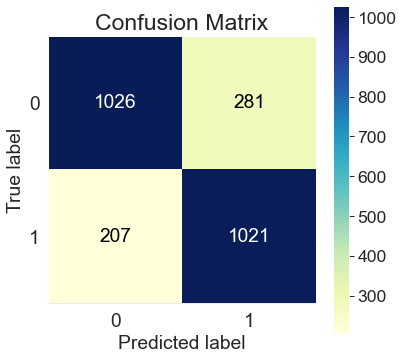

In [48]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(ytest, pred, figsize=(6,6), cmap= 'YlGnBu')
plt.show()

In [49]:
acc_test_lr=logreg.score(xtest,ytest)
recall=recall_score(ytest,pred)
f1=f1_score(ytest,pred)
print("Accuracy : ",acc_test_lr.round(3))
print("Recall : ",recall.round(3))
print("F1 Score :",f1.round(3))


Accuracy :  0.807
Recall :  0.831
F1 Score : 0.807


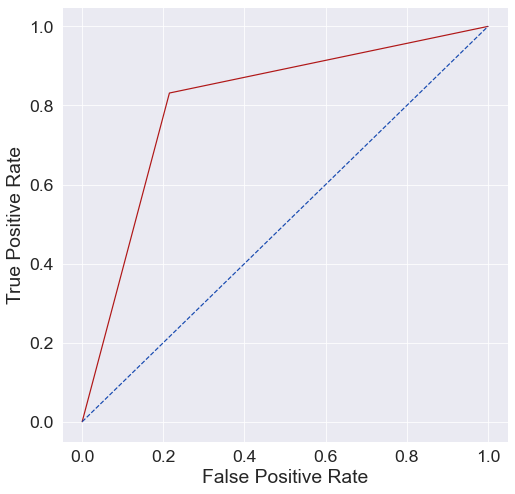

AUC_score: 0.8082185251552029


In [50]:
fpr, tpr, thresholds = roc_curve(ytest, pred)
plt.figure(figsize = (8, 8))
plt.plot(fpr,tpr, color = '#b01717', label = 'AUC = %0.3f' % auc(fpr,tpr))
plt.axis('tight')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.plot([0, 1], [0, 1], linestyle = '--', color = '#174ab0')
plt.show()
lr_roc_auc_score=roc_auc_score(ytest, pred)
print("AUC_score:",roc_auc_score(ytest, pred))

## SVM

### scaling

In [51]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(xtrain)
x_test = sc.fit_transform(xtest)

In [52]:
xtrain.sample(10)

,gender,age,hypertension,heart_disease,ever_married,work_type,avg_glucose_level,bmi,smoking_status,Residence_type
7380,0.0,0.959870,0.0,0.0,1.0,0.50,0.506404,0.391468,0.333333,1.0
4943,0.0,0.793188,0.0,0.0,1.0,0.00,0.535583,0.546821,0.333333,0.0
2651,0.0,0.694824,1.0,0.0,1.0,0.75,0.076086,0.702006,1.000000,0.0
7089,0.0,0.986577,0.0,0.0,1.0,0.50,0.236448,0.163028,0.333333,0.0
434,0.0,0.621582,1.0,0.0,1.0,0.50,0.478103,0.478510,1.000000,1.0
3746,0.0,0.633789,0.0,0.0,1.0,0.00,0.066708,0.762178,0.000000,0.0
8197,0.0,0.689473,1.0,0.0,1.0,0.00,0.111929,0.614246,0.333333,0.0
2481,0.0,0.877930,0.0,0.0,1.0,0.75,0.019110,0.361032,0.666667,0.0
3829,0.0,0.487305,0.0,0.0,0.0,0.00,0.136601,0.601719,0.666667,0.0
7832,0.0,0.963379,0.0,0.0,0.0,0.50,0.303129,0.336551,0.666667,0.0


### Building Model

In [53]:
from sklearn.svm import SVC
svc = SVC(random_state = 0, kernel='linear')
svc.fit(x_train, ytrain.values.ravel())

SVC(kernel='linear', random_state=0)

In [54]:
y_pred_svc=svc.predict(x_test)

### Measuring

Accuracy Score

In [103]:
from sklearn.metrics import accuracy_score

y_pred_svc = svc.predict(x_test)
acc_test_svc = accuracy_score(ytest.values.ravel(), y_pred_svc)
print(acc_test_svc)

print('Accuracy: %f' % acc_test_svc)

svc_perc_score = precision_score(ytest.values.ravel(), y_pred_svc)
svc_rec_score= recall_score(ytest.values.ravel(), y_pred_svc)
svc_f1_score = f1_score(ytest.values.ravel(), y_pred_svc)

print('Precision: %.3f' % svc_perc_score)
print('Recall: %.3f' % svc_rec_score)
print('F-measure: %.3f' % svc_f1_score)

svc_roc_auc_score = roc_auc_score(ytest, y_pred_svc)
print('ROC AUC Score:', svc_roc_auc_score)

0.8043392504930966
Accuracy: 0.804339
Precision: 0.776
Recall: 0.838
F-measure: 0.806
ROC AUC Score: 0.8053549666167392


classification Report

In [104]:
class_report=classification_report(ytest,y_pred_svc,target_names=['prob of getting stroke','Person of not getting stroke'])
print(class_report)

                              precision    recall  f1-score   support

      prob of getting stroke       0.84      0.77      0.80      1307
Person of not getting stroke       0.78      0.84      0.81      1228

                    accuracy                           0.80      2535
                   macro avg       0.81      0.81      0.80      2535
                weighted avg       0.81      0.80      0.80      2535



Roc Curve

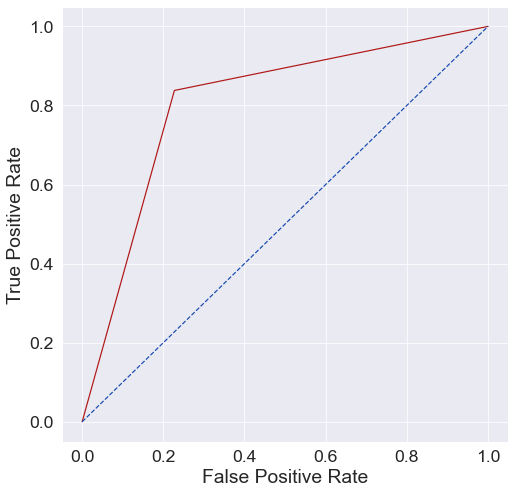

AUC_score: 0.8053549666167392


In [106]:
fpr, tpr, thresholds = roc_curve(ytest, y_pred_svc)
#plt.plot(fpr, tpr)
plt.figure(figsize = (8, 8))
plt.plot(fpr,tpr, color = '#b01717', label = 'AUC = %0.3f' % auc(fpr,tpr))
plt.axis('tight')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.plot([0, 1], [0, 1], linestyle = '--', color = '#174ab0')
plt.show()
svc_roc_auc_score=roc_auc_score(ytest, y_pred_svc)
print("AUC_score:",roc_auc_score(ytest, y_pred_svc))

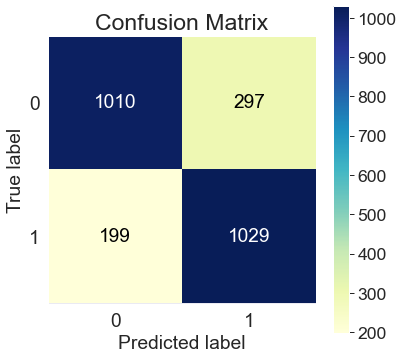

In [58]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(ytest, y_pred_svc, figsize=(6,6), cmap= 'YlGnBu')
plt.show()

In [59]:
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3)
scores_svc = cross_val_score(svc, disscale, y_smote.values.ravel(), cv=cv, scoring='roc_auc')

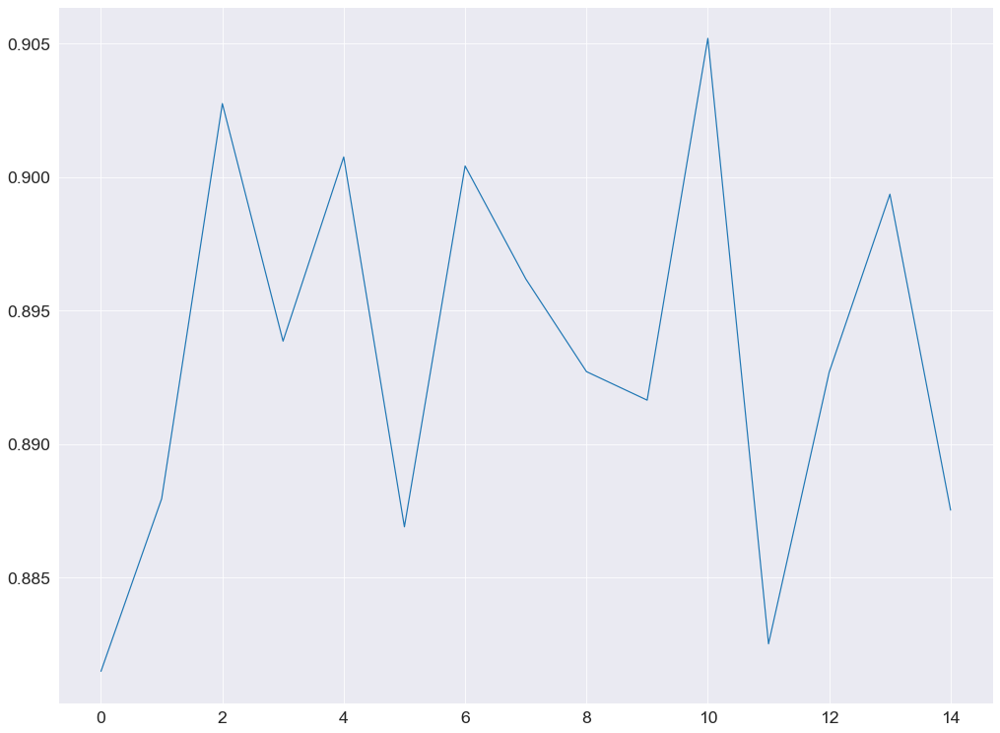

In [60]:
plt.plot(scores_svc)

In [61]:
svc_kf=scores_svc.mean().round(3)
print("Accuracy of SVM model",svc_kf)

Accuracy of SVM model 0.893


## Decision Tree

In [135]:
from sklearn.tree import DecisionTreeClassifier
dt =DecisionTreeClassifier()
dt.fit(x_train, ytrain.values.ravel())

y_pred_dt = dt.predict(x_test)
acc_test_dt = accuracy_score(ytest.values.ravel(), y_pred_dt)

print('Accuracy: %f' % acc_test_dt)

dt_perc_score = precision_score(ytest.values.ravel(), y_pred_dt)
dt_rec_score= recall_score(ytest.values.ravel(), y_pred_dt)
dt_f1_score = f1_score(ytest.values.ravel(), y_pred_dt)

print('Precision: %.3f' % dt_perc_score)
print('Recall: %.3f' % dt_rec_score)
print('F-measure: %.3f' % dt_f1_score)

y_pred_prob_dt = dt.predict_proba(x_test)[:, 1]
dt_roc_auc_score = roc_auc_score(ytest, y_pred_prob_dt)
print('ROC AUC Score:', dt_roc_auc_score)

Accuracy: 0.905720
Precision: 0.880
Recall: 0.932
F-measure: 0.905
ROC AUC Score: 0.9065265583216406


In [136]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus

In [119]:
dot_data=StringIO()
export_graphviz(dt,out_file=dot_data,filled=True,rounded=True,special_characters=True,feature_names=['gender','age','hypertension','heart_disease','ever_married','work_type','avg_glucose_level','bmi','smoking_status','Residence_type'])
graph=pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())


(process:20856): GLib-GIO-WARNING **: 23:52:32.566: Unexpectedly, UWP app `51456GRIDGAME.APKForWin11_1.2022.2119.0_x64__g94vhgmp24j9g' (AUMId `51456GRIDGAME.APKForWin11_g94vhgmp24j9g!App') supports 3 extensions but has no verbs

(process:20856): GLib-GIO-WARNING **: 23:52:33.052: Unexpectedly, UWP app `KDEe.V.Okular_22.801.1132.0_x64__7vt06qxq7ptv8' (AUMId `KDEe.V.Okular_7vt06qxq7ptv8!KDEe.V.Okular') supports 5 extensions but has no verbs

(process:20856): GLib-GIO-WARNING **: 23:52:33.240: Unexpectedly, UWP app `Clipchamp.Clipchamp_2.5.13.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs



In [137]:
class_report=classification_report(ytest,y_pred_dt,target_names=['prob of getting stroke','Person of not getting stroke'])
print(class_report)

                              precision    recall  f1-score   support

      prob of getting stroke       0.93      0.88      0.91      1307
Person of not getting stroke       0.88      0.93      0.91      1228

                    accuracy                           0.91      2535
                   macro avg       0.91      0.91      0.91      2535
                weighted avg       0.91      0.91      0.91      2535



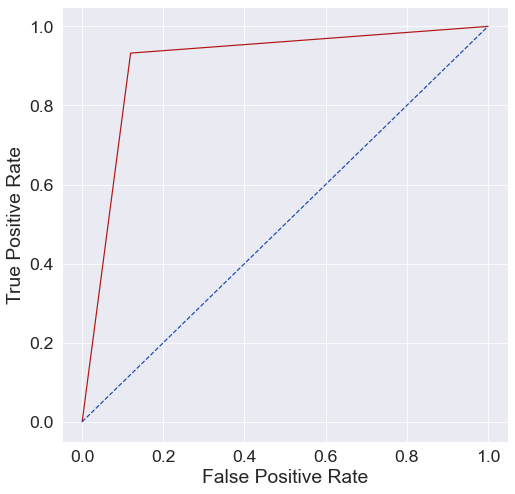

AUC_score: 0.9065265583216406


In [138]:
fpr, tpr, thresholds = roc_curve(ytest, y_pred_prob_dt)
#plt.plot(fpr, tpr)
plt.figure(figsize = (8, 8))
plt.plot(fpr,tpr, color = '#b01717', label = 'AUC = %0.3f' % auc(fpr,tpr))
plt.axis('tight')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.plot([0, 1], [0, 1], linestyle = '--', color = '#174ab0')
plt.show()
print("AUC_score:",roc_auc_score(ytest, y_pred_prob_dt))

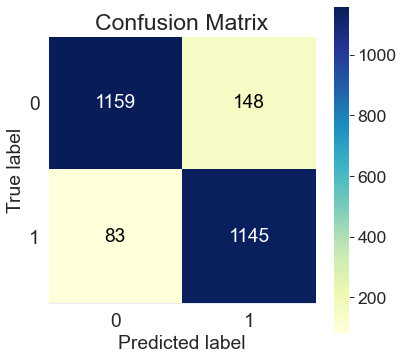

In [97]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(ytest, y_pred_dt, figsize=(6,6), cmap= 'YlGnBu')
plt.show()

In [66]:
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3)
scores_dt = cross_val_score(dt, disscale, y_smote.values.ravel(), cv=cv, scoring='roc_auc')


In [67]:
scores_dt

array([0.92781065, 0.93254438, 0.92781065, 0.9183432 , 0.92781065,
       0.9260355 , 0.92071006, 0.91893491, 0.93017751, 0.92307692,
       0.92662722, 0.9147929 , 0.91065089, 0.93017751, 0.92130178])

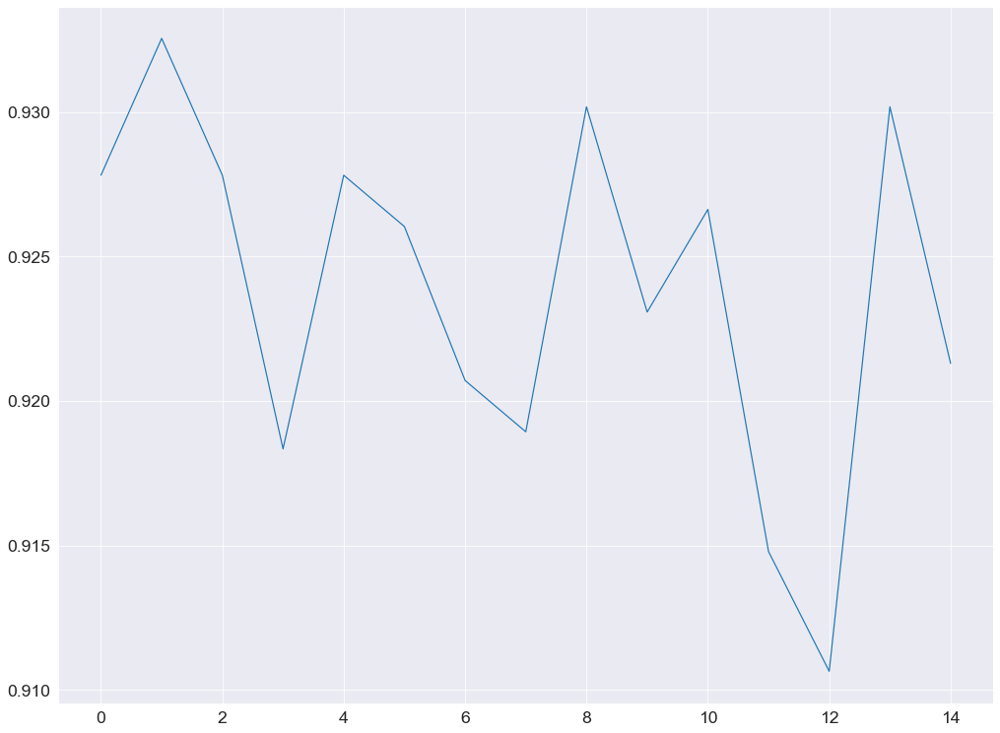

In [68]:
plt.plot(scores_dt)

In [69]:
dt_kf=scores_dt.mean().round(3)
print("Accuracy of Decision Tree model",dt_kf)

Accuracy of Decision Tree model 0.924


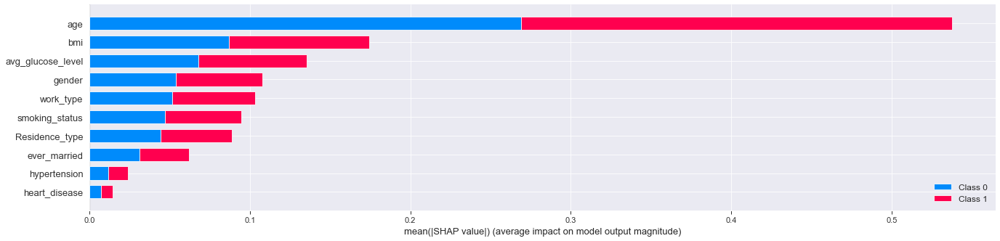

In [145]:
import shap

explainer = shap.TreeExplainer(dt)
# calculate shap values. This is what we will plot.
shap_values = explainer.shap_values(x_test)
shap.summary_plot(shap_values, x_train,['gender','age','hypertension','heart_disease','ever_married','work_type','avg_glucose_level','bmi','smoking_status','Residence_type'] ,plot_size=(19.5,5), alpha=0.2)

## Review 2

## KNN

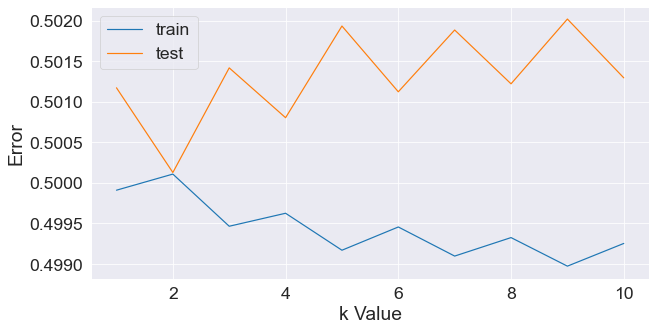

In [281]:
from sklearn.neighbors import KNeighborsClassifier
error1= []
error2= []
for k in range(1,11):
    knn= KNeighborsClassifier(n_neighbors=k)
    knn.fit(xtrain,ytrain)
    y_pred1= knn.predict(xtrain)
    error1.append(np.mean(ytrain.values != y_pred1))
    y_pred2= knn.predict(xtest)
    error2.append(np.mean(ytest.values != y_pred2))
plt.figure(figsize=(10,5))
# plt.figure(figsize = (8, 8))
plt.plot(range(1,11),error1,label="train")
plt.plot(range(1,11),error2,label="test")
plt.xlabel('k Value')
plt.ylabel('Error')
plt.legend()

In [282]:
knn = KNeighborsClassifier(n_neighbors=6)
knn.fit(xtrain, ytrain)

KNeighborsClassifier(n_neighbors=6)

In [287]:
y_pred_knn=knn.predict(xtest)
acc_test_knn = accuracy_score(ytest.values.ravel(), y_pred_knn)
knn_test_knn = accuracy_score(ytest.values.ravel(), y_pred_knn)
knn_perc_score = precision_score(ytest.values.ravel(), y_pred_knn)
knn_rec_score= recall_score(ytest.values.ravel(), y_pred_knn)
knn_f1_score = f1_score(ytest.values.ravel(), y_pred_knn)
knn_roc_auc_score = roc_auc_score(ytest, y_pred_knn)
y_pred_prob_knn = knn.predict_proba(x_test)[:, 1]
knn_roc_auc_score = roc_auc_score(ytest, y_pred_prob_knn)
print('Accuracy: %f' % acc_test_knn)
print('Precision: %.3f' % knn_perc_score)
print('Recall: %.3f' % knn_rec_score)
print('F-measure: %.3f' % knn_f1_score)

print('ROC AUC Score:', knn_roc_auc_score)

Accuracy: 0.875740
Precision: 0.836
Recall: 0.925
F-measure: 0.878
ROC AUC Score: 0.7912782960206753


In [290]:
class_report_knn=classification_report(ytest,y_pred_knn,target_names=['prob of getting stroke','Person of not getting stroke'])
print(class_report_knn)

                              precision    recall  f1-score   support

      prob of getting stroke       0.92      0.83      0.87      1307
Person of not getting stroke       0.84      0.93      0.88      1228

                    accuracy                           0.88      2535
                   macro avg       0.88      0.88      0.88      2535
                weighted avg       0.88      0.88      0.88      2535



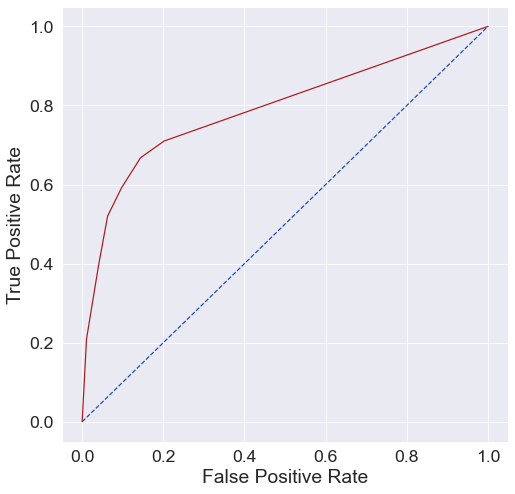

AUC_score: 0.7912782960206753


In [292]:
fpr, tpr, thresholds = roc_curve(ytest, y_pred_prob_knn)
#plt.plot(fpr, tpr)
plt.figure(figsize = (8, 8))
plt.plot(fpr,tpr, color = '#b01717', label = 'AUC = %0.3f' % auc(fpr,tpr))
plt.axis('tight')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.plot([0, 1], [0, 1], linestyle = '--', color = '#174ab0')
plt.show()
print("AUC_score:",roc_auc_score(ytest, y_pred_prob_knn))

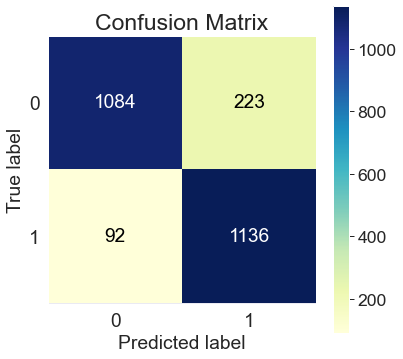

In [296]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(ytest,y_pred_knn, figsize=(6,6), cmap= 'YlGnBu')
plt.show()

In [293]:
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3)
scores_knn = cross_val_score(knn, disscale, y_smote.values.ravel(), cv=cv, scoring='roc_auc')

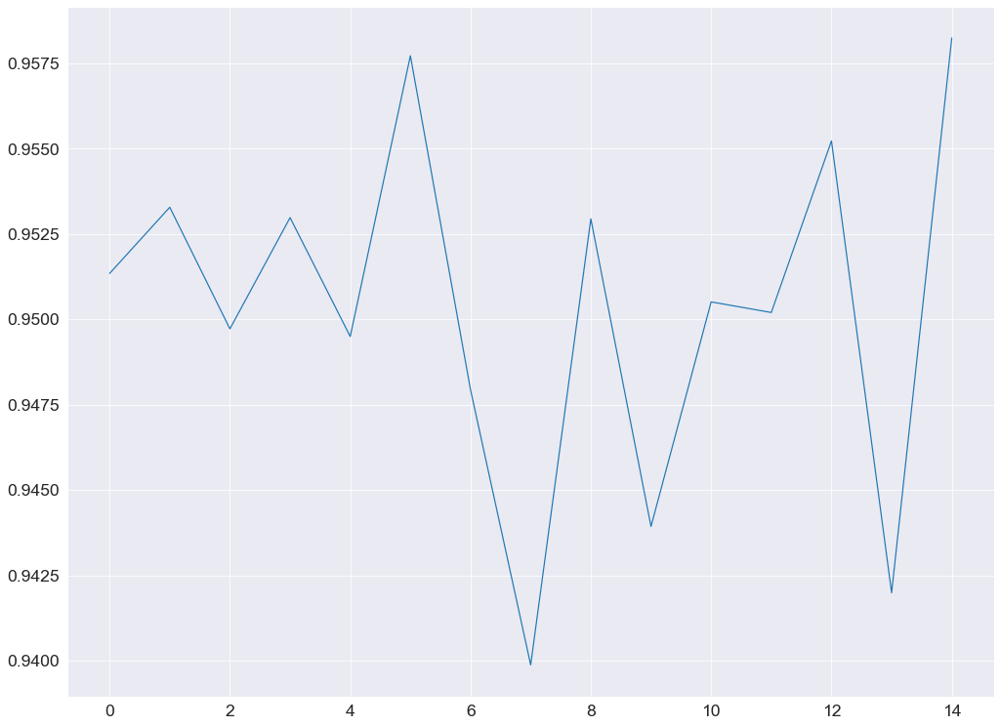

In [294]:
plt.plot(scores_knn)

In [295]:
knn_kf=scores_knn.mean().round(3)
print("Accuracy of KNN model",knn_kf)

Accuracy of KNN model 0.95


## Random Forest

In [109]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(criterion= 'gini', n_estimators= 100, random_state= 100)
rf.fit(xtrain,ytrain)

RandomForestClassifier(random_state=100)

In [110]:
y_pred_rf= rf.predict(xtest)
acc_test_rf = accuracy_score(ytest.values.ravel(), y_pred_rf)

print('Accuracy: %f' % acc_test_rf)

rf_perc_score = precision_score(ytest.values.ravel(), y_pred_rf)
rf_rec_score= recall_score(ytest.values.ravel(), y_pred_rf)
rf_f1_score = f1_score(ytest.values.ravel(), y_pred_rf)

print('Precision: %.3f' % rf_perc_score)
print('Recall: %.3f' % rf_rec_score)
print('F-measure: %.3f' % rf_f1_score)

y_pred_prob_rf = rf.predict_proba(x_test)[:, 1]
rf_roc_auc_score = roc_auc_score(ytest, y_pred_prob_rf)
print('ROC AUC Score:', rf_roc_auc_score)

Accuracy: 0.940828
Precision: 0.923
Recall: 0.958
F-measure: 0.940
ROC AUC Score: 0.7762377600941062


In [ ]:
import os
from sklearn.tree import export_graphviz
import six
import pydot
from sklearn import tree
dotfile = six.StringIO()
i_tree = 0
count=0
for tree_in_forest in rf.estimators_:
    if count<=5:
        export_graphviz(tree_in_forest,out_file='tree.dot',
        feature_names=['gender','age','hypertension','heart_disease','ever_married','work_type','avg_glucose_level','bmi','smoking_status','Residence_type'],
        filled=True,
        rounded=True)
        (graph,) = pydot.graph_from_dot_file('tree.dot')
        name = 'tree' + str(i_tree)
        graph.write_png(name+  '.png')
        os.system('dot -Tpng tree.dot -o tree.png')
        i_tree +=1
    count+=1

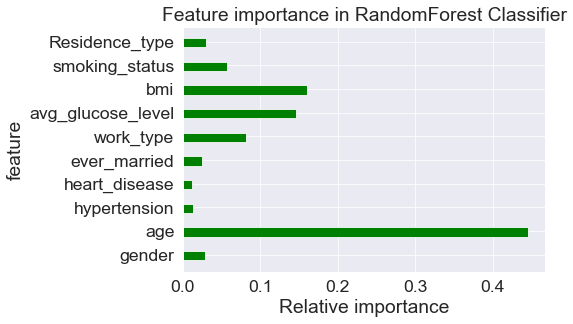

<Figure size 360x360 with 0 Axes>

In [152]:
col = ['gender','age','hypertension','heart_disease','ever_married','work_type','avg_glucose_level','bmi','smoking_status','Residence_type']
#modelname.feature_importance_
y = rf.feature_importances_
#plot
fig, ax = plt.subplots() 
width = 0.4 # the width of the bars 
ind = np.arange(len(y)) # the x locations for the groups
ax.barh(ind, y, width, color="green")
ax.set_yticks(ind+width/10)
ax.set_yticklabels(col, minor=False)
plt.title('Feature importance in RandomForest Classifier')
plt.xlabel('Relative importance')
plt.ylabel('feature') 
plt.figure(figsize=(5,5))
fig.set_size_inches(6.5, 4.5, forward=True)

In [111]:
class_report_rf=classification_report(ytest,y_pred_rf,target_names=['prob of getting stroke','Person of not getting stroke'])
print(class_report_rf)

                              precision    recall  f1-score   support

      prob of getting stroke       0.96      0.93      0.94      1307
Person of not getting stroke       0.92      0.96      0.94      1228

                    accuracy                           0.94      2535
                   macro avg       0.94      0.94      0.94      2535
                weighted avg       0.94      0.94      0.94      2535



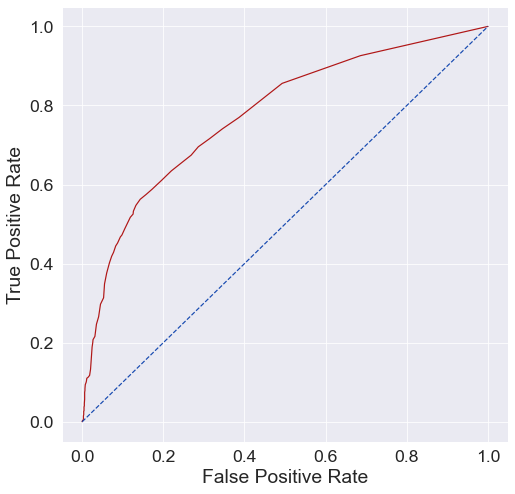

AUC_score: 0.7762377600941062


In [112]:
fpr, tpr, thresholds = roc_curve(ytest, y_pred_prob_rf)
#plt.plot(fpr, tpr)
plt.figure(figsize = (8, 8))
plt.plot(fpr,tpr, color = '#b01717', label = 'AUC = %0.3f' % auc(fpr,tpr))
plt.axis('tight')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.plot([0, 1], [0, 1], linestyle = '--', color = '#174ab0')
plt.show()
print("AUC_score:",roc_auc_score(ytest, y_pred_prob_rf))

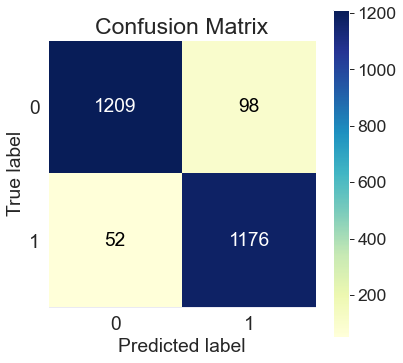

In [114]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(ytest, y_pred_rf, figsize=(6,6), cmap= 'YlGnBu')
plt.show()

In [115]:
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3)
scores_rf = cross_val_score(rf, disscale, y_smote.values.ravel(), cv=cv, scoring='roc_auc')

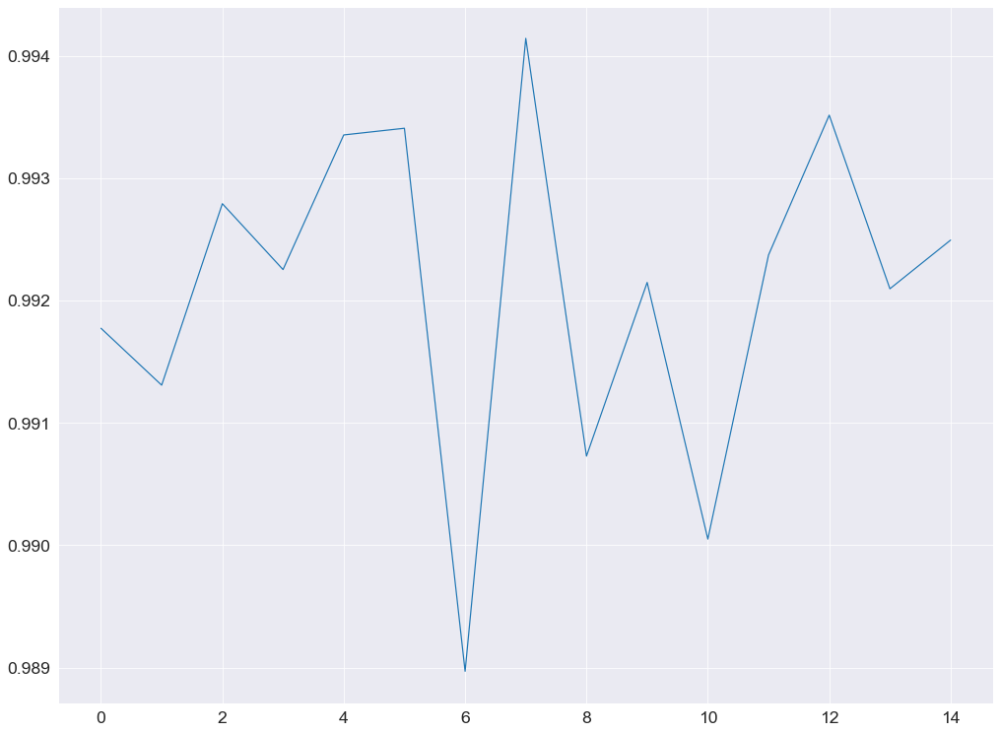

In [116]:
plt.plot(scores_rf)

In [404]:
rf_kf=scores_rf.mean().round(3)
print("Accuracy of Random Forest model",rf_kf)

Accuracy of Random Forest model 0.992


## Perceptron

In [381]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split

In [432]:
mlp = MLPClassifier(hidden_layer_sizes=(8,8,8),activation='logistic', solver='adam', max_iter=1000)

In [433]:
mlp.fit(x_train,ytrain)

MLPClassifier(activation='logistic', hidden_layer_sizes=(8, 8, 8),
              max_iter=1000)

In [434]:
predict_train = mlp.predict(x_train)
predict_test = mlp.predict(x_test)

In [435]:
cm_per=confusion_matrix(ytest,predict_test)
print(classification_report(ytest,predict_test))

              precision    recall  f1-score   support

           0       0.89      0.81      0.85      1307
           1       0.81      0.90      0.85      1228

    accuracy                           0.85      2535
   macro avg       0.85      0.85      0.85      2535
weighted avg       0.85      0.85      0.85      2535



<AxesSubplot:>

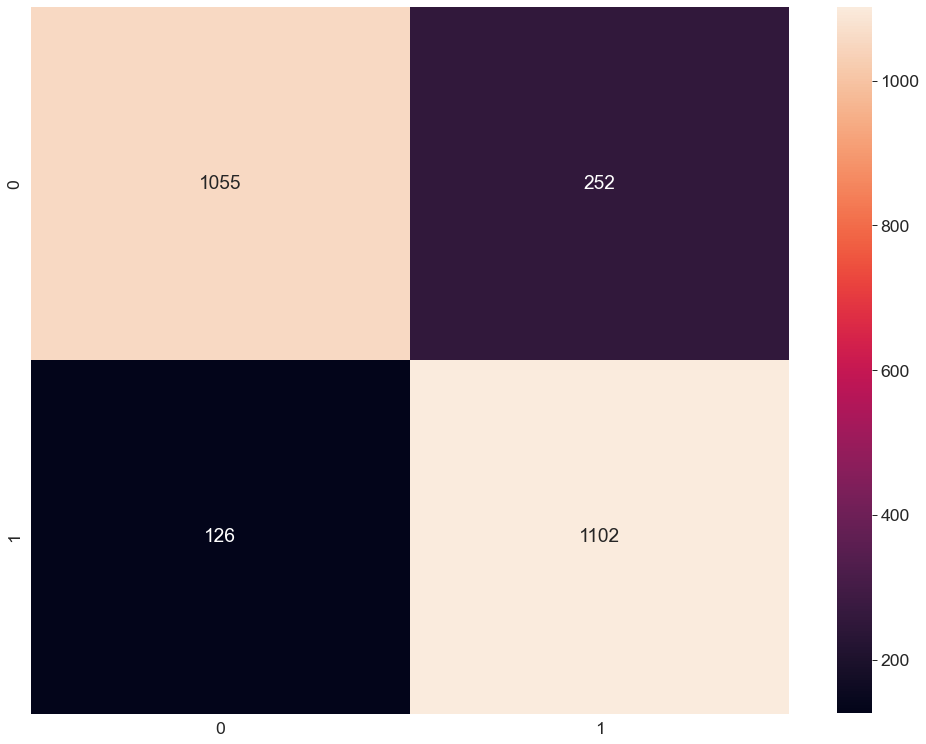

In [436]:
sns.heatmap(cm_per,annot=True,fmt='g')

In [437]:
perceptron_roc_auc_score = roc_auc_score(ytest, predict_test)
print('ROC AUC Score:', perceptron_roc_auc_score)

ROC AUC Score: 0.8522930898270151


In [438]:
class_report_per=classification_report(ytest,predict_test,target_names=['prob of getting stroke','Person of not getting stroke'])
print(class_report_per)

                              precision    recall  f1-score   support

      prob of getting stroke       0.89      0.81      0.85      1307
Person of not getting stroke       0.81      0.90      0.85      1228

                    accuracy                           0.85      2535
                   macro avg       0.85      0.85      0.85      2535
                weighted avg       0.85      0.85      0.85      2535



In [439]:
acc_test_perceptron = accuracy_score(ytest.values.ravel(), predict_test)
#print(acc_test_perceptron)

print('Accuracy: %f' % acc_test_perceptron)

perceptron_perc_score = precision_score(ytest.values.ravel(), predict_test)
perceptron_rec_score= recall_score(ytest.values.ravel(), predict_test)
perceptron_f1_score = f1_score(ytest.values.ravel(), predict_test)
y_pred_prob_per = mlp.predict_proba(x_test)[:, 1]
per_roc_auc_score = roc_auc_score(ytest, y_pred_prob_per)
print('Precision: %.3f' % perceptron_perc_score)
print('Recall: %.3f' % perceptron_rec_score)
print('F-measure: %.3f' % perceptron_f1_score)
print('ROC AUC Score:', per_roc_auc_score)

Accuracy: 0.850888
Precision: 0.814
Recall: 0.897
F-measure: 0.854
ROC AUC Score: 0.9218913941218545


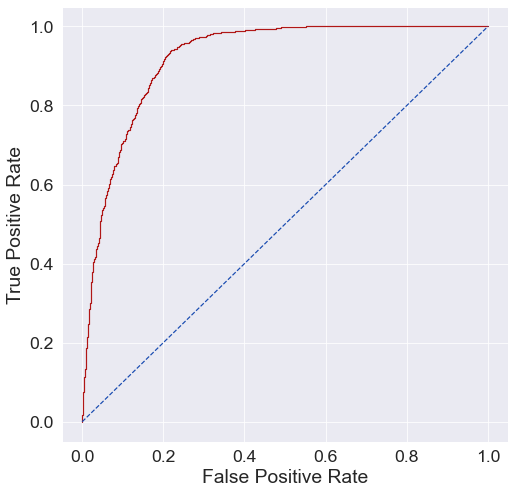

AUC_score: 0.9218913941218545


In [440]:
fpr, tpr, thresholds = roc_curve(ytest, y_pred_prob_per)
#plt.plot(fpr, tpr)
plt.figure(figsize = (8, 8))
plt.plot(fpr,tpr, color = '#b01717', label = 'AUC = %0.3f' % auc(fpr,tpr))
plt.axis('tight')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.plot([0, 1], [0, 1], linestyle = '--', color = '#174ab0')
plt.show()
perceptron_roc_auc_score=roc_auc_score(ytest, y_pred_prob_per)
print("AUC_score:",roc_auc_score(ytest, y_pred_prob_per))

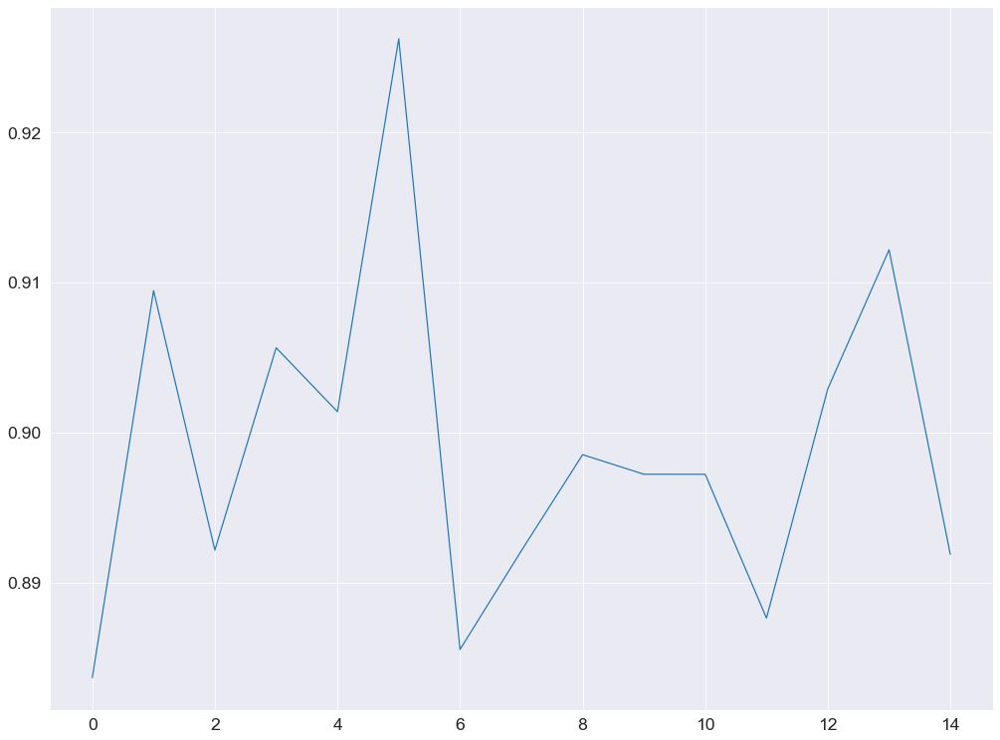

In [442]:
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3)
mlp = MLPClassifier(hidden_layer_sizes=(8,8,8),activation='logistic', solver='adam', max_iter=1000)
scores_perceptron = cross_val_score(mlp, disscale, y_smote.values.ravel(), cv=cv, scoring='roc_auc')
plt.plot(scores_perceptron)

In [443]:
per_kf=scores_perceptron.mean().round(3)
print("Accuracy of Perceptron model",per_kf)

Accuracy of Perceptron model 0.899


## K_means

In [302]:
modelkmeans=x_smote
target=y_smote

In [303]:
kmeans_xtrain,kmeans_xtest,kmeans_ytrain,kmeans_ytest=train_test_split(modelkmeans,target,test_size=0.3)
kmeans_xtrain.shape

(5915, 10)

In [304]:
from sklearn.cluster import KMeans  
wcss_list= [] 
for i in range(2, 20):  
    kmeans = KMeans(n_clusters=i, init='random')  
    kmeans.fit(kmeans_xtrain)  
    wcss_list.append(kmeans.inertia_)  
# plt.plot(range(2, 20), wcss_list)  
# plt.title('The Elobw Method Graph')  
# plt.xlabel('Number of clusters(k)')  
# plt.ylabel('wcss_list')  
# plt.show()  

In [305]:
kmeans=KMeans(n_clusters=2,init='random',random_state= 42)
kmeans.fit(kmeans_xtrain)
kmeans_pred=kmeans.fit_predict(kmeans_xtest)
# kmeans_pred=kmeans.fit_predict(modelkmeans)
kmeans_pred.shape

(2535,)

In [306]:
kmeans_result=pd.DataFrame({'Predicted':kmeans_pred,'Actual':kmeans_ytest.values.reshape(-1)})
kmeans_result

,Predicted,Actual
0,1,0
1,1,1
2,0,1
3,0,0
4,1,0
...,...,...
2530,1,1
2531,1,1
2532,0,0
2533,1,1


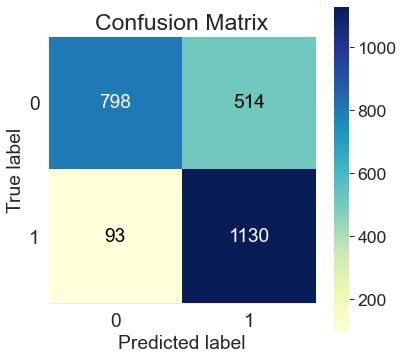

In [307]:
skplt.metrics.plot_confusion_matrix(kmeans_ytest, kmeans_pred, figsize=(6,6), cmap= 'YlGnBu')
# skplt.metrics.plot_confusion_matrix(target, kmeans_pred, figsize=(6,6), cmap= 'YlGnBu')

plt.show()

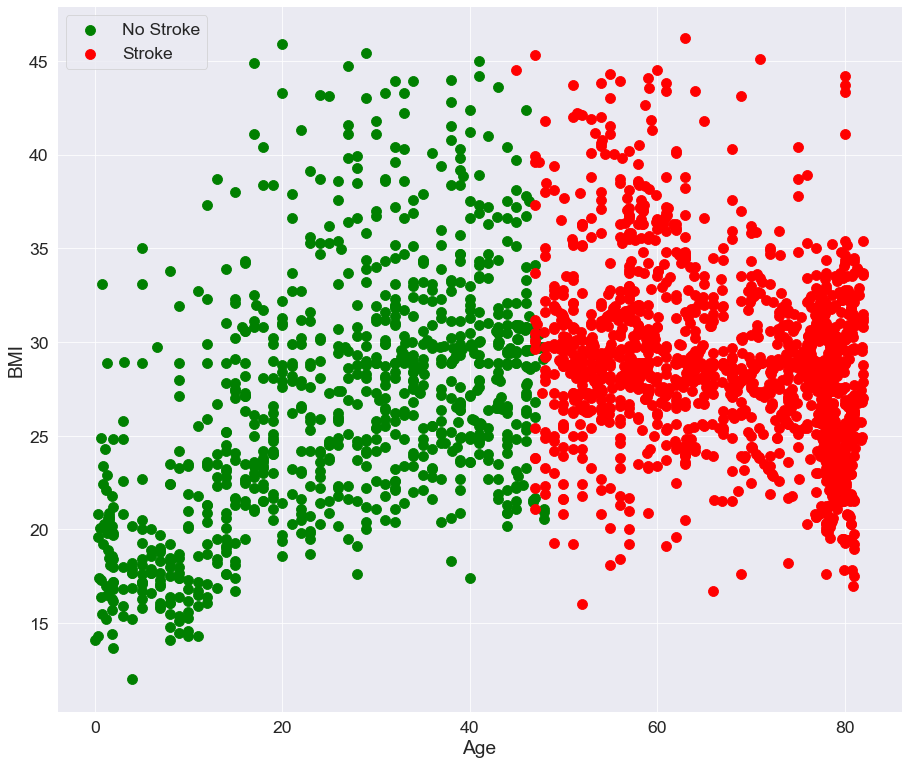

In [313]:
plotcluster=pd.DataFrame({0:kmeans_xtest['age'],1:kmeans_xtest['bmi']})
plotcluster=plotcluster.iloc[:,[0,1]].values
plt.figure(figsize=(13,11))
plt.scatter(plotcluster[kmeans_pred== 0,0], plotcluster[kmeans_pred == 0, 1], s = 100, c = 'green', label = 'No Stroke')
plt.scatter(plotcluster[kmeans_pred == 1,0], plotcluster[kmeans_pred == 1, 1], s = 100, c = 'red', label = 'Stroke') 

plt.xlabel('Age')  
plt.ylabel('BMI')  
plt.legend()  
plt.tight_layout()
plt.show()  

In [319]:
kmeans_acc_score = accuracy_score(kmeans_ytest,kmeans_pred)
kmeans_perc_score = precision_score(kmeans_ytest,kmeans_pred)
kmeans_rec_score= recall_score(kmeans_ytest,kmeans_pred)
kmeans_f1_score = f1_score(kmeans_ytest,kmeans_pred)
kmeans_roc_auc_score = roc_auc_score(kmeans_ytest,kmeans_pred)

print('Accuracy: ',round(kmeans_acc_score,3))
print('Precision: ', round(kmeans_perc_score,3))
print('Recall: ',round(kmeans_rec_score,3))
print('F-measure: ',round(kmeans_f1_score,3))
print('ROC AUC Score:', round(kmeans_roc_auc_score,3))

Accuracy:  0.761
Precision:  0.687
Recall:  0.924
F-measure:  0.788
ROC AUC Score: 0.766


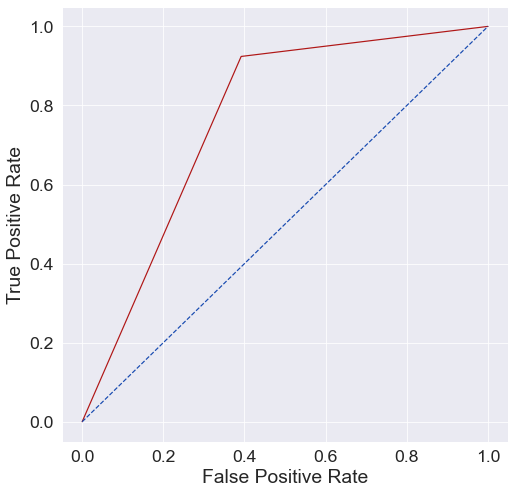

In [320]:
fpr, tpr, thresholds = roc_curve(kmeans_ytest, kmeans_pred)
plt.figure(figsize = (8, 8))
plt.plot(fpr,tpr, color = '#b01717', label = 'AUC = %0.3f' % auc(fpr,tpr))
plt.axis('tight')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.plot([0, 1], [0, 1], linestyle = '--', color = '#174ab0')
plt.show()

In [321]:
class_report_kmeans=classification_report(kmeans_ytest,kmeans_pred,target_names=['prob of getting stroke','Person of not getting stroke'])
print(class_report_kmeans)

                              precision    recall  f1-score   support

      prob of getting stroke       0.90      0.61      0.72      1312
Person of not getting stroke       0.69      0.92      0.79      1223

                    accuracy                           0.76      2535
                   macro avg       0.79      0.77      0.76      2535
                weighted avg       0.80      0.76      0.76      2535



# Performance of Models

In [72]:
from sklearn.naive_bayes import GaussianNB
GNB = GaussianNB()

In [ ]:
import seaborn as sns
Performance = pd.DataFrame(
    data = {
        'Model_after_resamppling': ['Logistic Regression','SVM','Decision Tree','Random Forest','KNN','Perceptron'],
        'Score': [acc_test_lr, acc_test_svc, acc_test_dt,acc_test_rf,acc_test_knn,acc_test_perceptron],
        'K-Fold_Scores':[lr_kf,svc_kf,dt_kf,rf_kf,knn_kf,per_kf],
        'ROC_AUC_Score': [lr_roc_auc_score, svc_roc_auc_score, dt_roc_auc_score,rf_roc_auc_score,knn_roc_auc_score,perceptron_roc_auc_score]
        
    }
)
print(Performance)
print()
plt.figure(figsize=(18, 18))
plt.subplot(3,1,1)
ax = sns.barplot(x="Model_after_resamppling", y="Score", data= Performance, palette="YlOrBr")
for i in ax.containers:
    ax.bar_label(i,)
#ax.bar_label(ax.containers[0])
plt.title('Performance analysis of different classifiers',fontsize=15)
plt.subplot(3,1,2)
ax = sns.barplot(x="Model_after_resamppling", y="ROC_AUC_Score", data= Performance, palette="YlOrBr")
for i in ax.containers:
    ax.bar_label(i,)
#ax.bar_label(ax.containers[0])
plt.title('Performance analysis of different classifiers',fontsize=15)
plt.subplot(3,1,3)
ax = sns.barplot(x="Model_after_resamppling", y="K-Fold_Scores", data= Performance, palette="YlOrBr")
for i in ax.containers:
    ax.bar_label(i,)
#ax.bar_label(ax.containers[0])
plt.title('Performance analysis of different classifiers',fontsize=15)

plt.tight_layout()
plt.show()


In [ ]:
import seaborn as sns
Performance = pd.DataFrame(
    data = {
        'Models': ['K-means'],
        'Accuracy_Score': [kmeans_acc_score],
        'ROC_AUC_Score': [kmeans_roc_auc_score]
        
    }
)
print(Performance)
print()
plt.figure(figsize=(15, 13))
plt.subplot(2,2,1)
ax = sns.barplot(x="Models", y="Accuracy_Score", data= Performance, palette="YlOrBr")
for i in ax.containers:
    ax.bar_label(i,)
#ax.bar_label(ax.containers[0])
plt.title('Performance analysis of unsupervised classifiers',fontsize=15)
plt.subplot(2,2,2)
ax = sns.barplot(x="Models", y="ROC_AUC_Score", data= Performance, palette="YlOrBr")
for i in ax.containers:
    ax.bar_label(i,)
#ax.bar_label(ax.containers[0])
plt.title('Performance analysis of unsupervised classifiers',fontsize=15)

plt.tight_layout()
plt.show()
